In [132]:
# DEFINES
import pandas as pd
import pandas_profiling 
import numpy as np
from sklearn import datasets, svm, metrics
import seaborn as sns
import statistics

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = [12, 8]

In [133]:
fileUrl_ru = 'russian_universities_with_rating_and_manual.csv'
df_ru = pd.read_csv(fileUrl_ru, sep=';')
df_ru.head(3)

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,NaN,NaN,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1c-bitrix,bitrix special-aaVersion,php,NaN,NaN
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,NaN,NaN,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [134]:
for col in ['site_engine', 'vi_source', 'site_lang', 'site_front', 'site_crm']:
  if col == 'site_engine':
    for idx, row in df_ru.iterrows():
      if pd.isna(row[col]) and row['site_lang'] == 'asp.net':
        df_ru.loc[idx, col] = 'asp.net'
      if row[col] == 'dnn':
        df_ru.loc[idx, col] = 'dnn (asp.net)'
  if col == 'site_lang':
    for idx, row in df_ru.iterrows():
      if row[col] == 'asp.net':
        df_ru.loc[idx, col] = 'asp.net (C#)'
  df_ru[col].fillna('не определено', inplace=True)

for col in ['site_error', 'vi_not_work', 'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc', 'vi_pictures_switch_wc', 
            'vi_line_spacing', 'vi_letter_spacing', 'vi_scroll', 'vi_scale_br', 'vi_another_content', 'vi_fonts_switch']:
  df_ru[col].fillna(0, inplace=True)

In [135]:
print(df_ru['site_engine'].value_counts())

1c-bitrix               182
не определено           150
joomla                   72
wordpress                52
drupal                   40
asp.net                  16
umi.cms                   6
laravel                   6
typo3                     6
yii                       5
modx                      4
dnn (asp.net)             4
django cms                3
dle                       3
ruby on rails             3
codeigniter               2
opencms                   2
orchard cms               2
wagtail cms (django)      1
symfony                   1
mediawiki                 1
plone cms                 1
liferay                   1
odoo                      1
kohana                    1
bolt cms                  1
tilda                     1
next.js                   1
siteedit                  1
django                    1
livestreet                1
Name: site_engine, dtype: int64


In [136]:
df_ru['custom__category'] = df_ru['custom__category'].apply(lambda x: x.strip())

найдено js фреймворков - 33 - 5.8% сайтов

In [137]:
df_tmp = df_ru['vi_source'].value_counts().to_frame()
sum = df_tmp['vi_source'].sum()
print(sum)
for idx, row in df_tmp.iterrows():
  df_tmp.at[idx, 'vi_source_pct'] = round(int(row['vi_source']) * 100 / sum, 2)
display(df_tmp)

571


,vi_source,vi_source_pct
не определено,350,61.30
isvek.ru (bvi),70,12.26
bitrix special-aaVersion,41,7.18
slabovid.ru (mibok),27,4.73
joomla template Accessibility,24,4.20
finevision.ru,12,2.10
lidrekon.ru,11,1.93
div=access,9,1.58
prolexgroup.ru/special,8,1.40
Comfortable Reading Plugin,8,1.40


In [138]:
def checkEngine(x):
  if x in ['1c-bitrix', 'joomla', 'wordpress', 'drupal', 'laravel', 'typo3', 'umi.cms', 'yii', 'dnn (asp.net)', 'asp.net', 'не определено']:
    return x
  else:
    return 'другое'  
df_ru['site_engine'] = df_ru['site_engine'].apply(checkEngine)

def checkSource(x):
  if x in ['joomla template Accessibility', 'div=access']:
    return 'div class=access'
  else:
    return x
df_ru['vi_source'] = df_ru['vi_source'].apply(checkSource)

print(df_ru['site_engine'].value_counts())
print("*"*25)
print(df_ru['vi_source'].value_counts())
print("*"*25)
print(df_ru['site_lang'].value_counts())
print("*"*25)
print(df_ru['site_front'].value_counts())
print("*"*25)
print(df_ru['site_crm'].value_counts())
print("*"*25)
print(df_ru['custom__category'].value_counts())
print("*"*25)

1c-bitrix        182
не определено    150
joomla            72
wordpress         52
drupal            40
другое            32
asp.net           16
laravel            6
typo3              6
umi.cms            6
yii                5
dnn (asp.net)      4
Name: site_engine, dtype: int64
*************************
не определено                 350
isvek.ru (bvi)                 70
bitrix special-aaVersion       41
div class=access               33
slabovid.ru (mibok)            27
finevision.ru                  12
lidrekon.ru                    11
prolexgroup.ru/special          8
Comfortable Reading Plugin      8
vi-panel                        5
userway.org                     4
pojo.me                         1
b-accessibility                 1
Name: vi_source, dtype: int64
*************************
php              482
не определено     48
asp.net (C#)      22
java               8
python             7
ruby               3
node.js            1
Name: site_lang, dtype: int64
***************

In [139]:
cmap=plt.get_cmap('Pastel1')
print(cmap.colors)

((0.984313725490196, 0.7058823529411765, 0.6823529411764706), (0.7019607843137254, 0.803921568627451, 0.8901960784313725), (0.8, 0.9215686274509803, 0.7725490196078432), (0.8705882352941177, 0.796078431372549, 0.8941176470588236), (0.996078431372549, 0.8509803921568627, 0.6509803921568628), (1.0, 1.0, 0.8), (0.8980392156862745, 0.8470588235294118, 0.7411764705882353), (0.9921568627450981, 0.8549019607843137, 0.9254901960784314), (0.9490196078431372, 0.9490196078431372, 0.9490196078431372))


([<matplotlib.patches.Wedge at 0x7f58c782d310>,
 [Text(-0.4714062583478313, 2.1489011470029276, '1c-bitrix'),
  Text(-1.9596645587292998, -0.9998573984625501, 'не определено'),
  Text(0.26864633363175755, -2.1835359276701207, 'joomla'),
  Text(1.5853008720810657, -1.5253921282670275, 'wordpress'),
  Text(2.126077447034796, -0.5655039250173305, 'drupal'),
  Text(2.1796343281636257, 0.2986539728359558, 'другое'),
  Text(2.0261078560706083, 0.8572554785878961, 'asp.net'),
  Text(2.1679235408906226, 1.2450331404634438, 'laravel'),
  Text(2.2475438976564766, 1.4961772716182844, 'typo3'),
  Text(2.302746949317321, 1.7627695502843732, 'umi.cms'),
  Text(2.343077746753636, 2.0297750300631607, 'yii'),
  Text(2.3842372462672294, 2.281537366231826, 'dnn (asp.net)')],
 [Text(-0.3642684723596878, 1.6605145226840805, '31.9%'),
  Text(-1.5142862499271863, -0.7726170806301523, '26.3%'),
  Text(0.207590348715449, -1.687277762290548, '12.6%'),
  Text(1.225005219335369, -1.1787120991154305, '9.1%'),
  Te

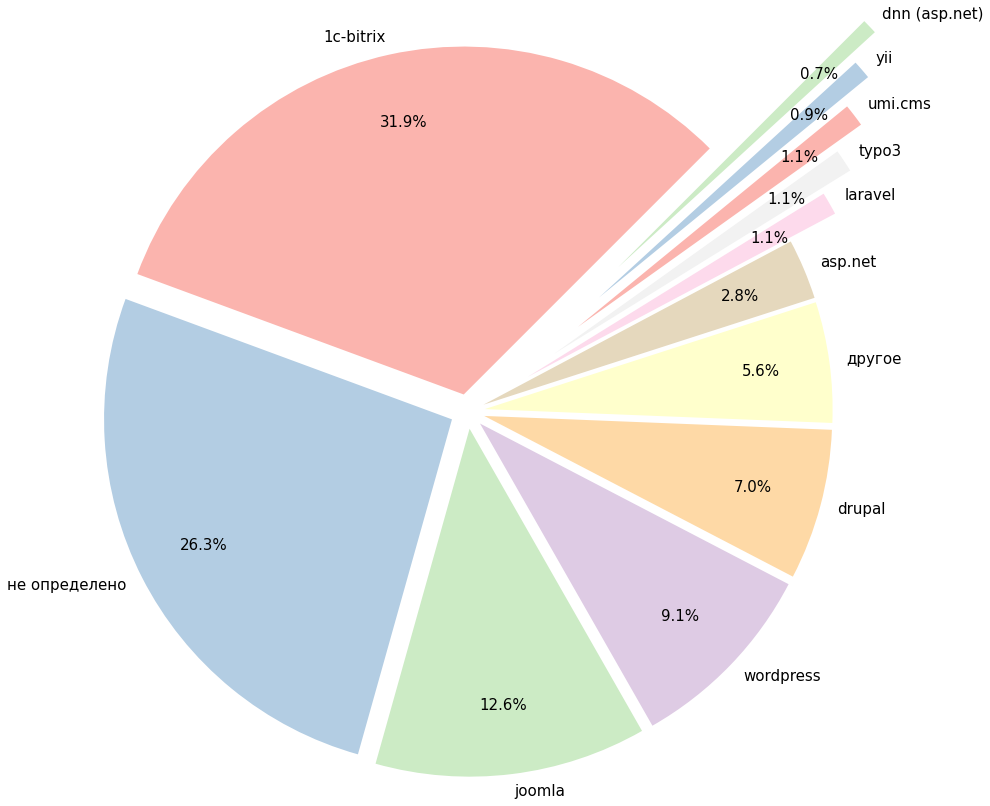

In [140]:
# df_ru['site_engine'].value_counts().plot(kind='pie', figsize=(8,8), label="", subplots=True)

plt.pie(df_ru['site_engine'].value_counts(), labels=df_ru['site_engine'].value_counts().index.values, autopct='%1.1f%%', shadow=False, radius = 2, startangle = 45, explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.4, 0.6, 0.8, 1, 1.2), textprops = {"fontsize":15}, pctdistance = 0.8, labeldistance = 1.05, colors=cmap.colors) 

In [60]:
import plotly
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots

fig = go.Figure()
fig.add_trace(go.Pie(values=df_ru['site_engine'].value_counts(), labels=df_ru['site_engine'].value_counts().index, sort = True))
fig.show()

([<matplotlib.patches.Wedge at 0x7f58c31a0610>,
 [Text(-2.104498641298553, -0.6411594721849981, 'php'),
  Text(2.194589208441983, 0.15420183588398978, 'не определено'),
  Text(2.15552767828615, 1.055320059575444, 'asp.net (C#)'),
  Text(2.1155692991929183, 1.5114121014178714, 'java'),
  Text(2.136373610151419, 1.8099469047042773, 'python'),
  Text(2.1788672460130947, 2.062168161002228, 'ruby'),
  Text(2.275157114360955, 2.2502577863375413, 'node.js')],
 [Text(-1.6262034955488818, -0.4954414103247713, '84.4%'),
  Text(1.6958189337960776, 0.11915596409217391, '8.4%'),
  Text(1.7064594119765357, 0.8354617138305598, '3.9%'),
  Text(1.7087290493481264, 1.2207559280682807, '1.4%'),
  Text(1.7548783226243798, 1.4867421002927992, '1.2%'),
  Text(1.8157227050109124, 1.7184734675018571, '0.5%'),
  Text(1.919663815242056, 1.8986550072223007, '0.2%')])

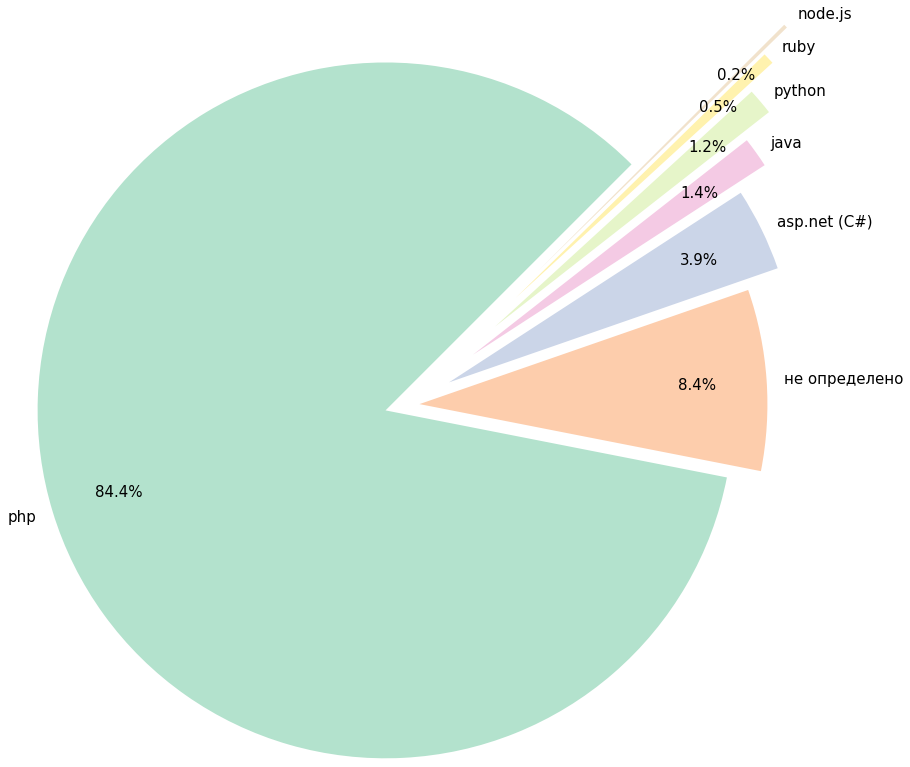

In [61]:
plt.pie(df_ru['site_lang'].value_counts(), labels=df_ru['site_lang'].value_counts().index.values, autopct='%1.1f%%', shadow=False, radius = 2, startangle = 45, explode = (0.1, 0.1, 0.3, 0.5, 0.7, 0.9, 1.1), textprops = {"fontsize":15}, pctdistance = 0.8, labeldistance = 1.05, colors=plt.get_cmap('Pastel2').colors) 

In [62]:
fig = go.Figure()
fig.add_trace(go.Pie(values=df_ru['site_lang'].value_counts(), labels=df_ru['site_lang'].value_counts().index, sort = True))
fig.show()

In [63]:
print("Среднее кол-во размеров шрифта, если есть переключатели: {0}".format(df_ru[df_ru.vi_font_sizes > 0]['vi_font_sizes'].mean()))
print("Среднее кол-во заданных размеров шрифта (без кнопок больше меньше), если есть переключатели: {0}".format(df_ru[(df_ru.vi_font_sizes > 0) & (df_ru.vi_font_sizes < 10)]['vi_font_sizes'].mean()))
print("Среднее кол-во цветовых схем, если есть переключатели: {0}".format(df_ru[df_ru.vi_color_schemes > 0]['vi_color_schemes'].mean()))
print("Среднее кол-во режимов изображений (например - показаны, откл, откл. только в новостях, черно белые), если есть переключатели: {0}".format(df_ru[df_ru.vi_pictures_modes > 0]['vi_pictures_modes'].mean()))
print("Среднее кол-во гарнитур, если есть переключатели: {0}".format(df_ru[df_ru.vi_fonts_switch > 0]['vi_fonts_switch'].mean()))

Среднее кол-во размеров шрифта, если есть переключатели: 4.738839285714286
Среднее кол-во заданных размеров шрифта (без кнопок больше меньше), если есть переключатели: 3.1507246376811593
Среднее кол-во цветовых схем, если есть переключатели: 3.8364928909952605
Среднее кол-во режимов изображений (например - показаны, откл, откл. только в новостях, черно белые), если есть переключатели: 2.386996904024768
Среднее кол-во гарнитур, если есть переключатели: 2.076923076923077


In [64]:
for col in ['site_error', 'vi_not_work', 'vi_scroll', 'vi_scale_br']:
  df_tmp_stat = df_ru.groupby([col])[col].agg(['count'])
  df_tmp_stat['pct'] = round(df_tmp_stat['count'] * 100 / df_ru.shape[0], 2)
  display(df_tmp_stat)
  print("*"*40)

,count,pct
site_error,,
0.0,564,98.77
1.0,7,1.23


****************************************


,count,pct
vi_not_work,,
0.0,525,91.94
1.0,46,8.06


****************************************


,count,pct
vi_scroll,,
0.0,347,60.77
1.0,224,39.23


****************************************


,count,pct
vi_scale_br,,
0.0,399,69.88
1.0,172,30.12


****************************************


In [141]:
df_ru[df_ru.vi_found == 0]

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm
9,Башкирский государственный университет,общий,https://bashedu.ru/,Bashkir State University,60.0,NaN,NaN,NaN,9.0,Уфа,2,https://bashedu.ru/,https://pk.bashedu.ru/,https://bashedu.ru/studencheskaya-zhizn,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,drupal,не определено,php,не определено,не определено
41,Грозненский государственный нефтяной техническ...,спец технический,https://gstou.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Грозный,95,https://gstou.ru/,https://gstou.ru/abitur/,https://gstou.ru/university/business.php,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено
51,Ивановский государственный университет,общий,http://ivanovo.ac.ru/,Ivanovo State University,144.0,NaN,NaN,NaN,NaN,Иваново,37,http://ivanovo.ac.ru/,https://abitur.ivanovo.ac.ru/,http://ivanovo.ac.ru/about_the_university/facu...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,не определено,php,не определено,не определено
77,Сибирский Федеральный Университет,общий,https://www.sfu-kras.ru/,Siberian Federal University,10.0,49.0,23.0,23.0,8.0,Красноярск,24,https://www.sfu-kras.ru/,http://admissions.sfu-kras.ru/,http://structure.sfu-kras.ru/csk,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,drupal,не определено,php,не определено,не определено
158,Российский университет Дружбы Народов,гуманитарный,http://www.rudn.ru/,RUDN University,17.0,19.0,19.0,8.0,6.0,Москва,77,http://www.rudn.ru/,https://www.rudn.ru/admissions,https://www.rudn.ru/life/student-organizations,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено
160,Российско-Таджикский (Cлавянский) университет,гуманитарный,http://rtsu.tj/,NaN,NaN,NaN,NaN,NaN,NaN,Душанбе,0,http://rtsu.tj/,http://rtsu.tj/ru/admission/,http://rtsu.tj/ru/learners/studencheskie-soobs...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1c-bitrix,не определено,php,не определено,не определено
161,"Южный федеральный университет, академия архите...",архитектурный,http://www.raai.sfedu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ростов-на-Дону,61,http://www.raai.sfedu.ru/,http://www.raai.sfedu.ru/04_postuplen/001_obsh...,http://www.raai.sfedu.ru/08_cours/001_about_co...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,php,не определено,не определено
162,Южный федеральный университет (ЮФУ),общий,https://sfedu.ru/,Southern Federal University,31.0,36.0,28.0,18.0,9.0,Ростов-на-Дону,61,https://sfedu.ru/,https://sfedu.ru/www/stat_pages22.show?p=ABT/m...,https://sfedu.ru/www/stat_pages22.show?p=EDU/m...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено
180,Санкт-Петербургский государственный технологич...,спец технический,http://technolog.edu.ru/,Saint Petersburg State Institute of Technology,220.0,76.0,NaN,NaN,NaN,Санкт-Петербург,78,http://technolog.edu.ru/,http://technolog.edu.ru/abiturientu.html,http://technolog.edu.ru/studentu/studsovet.html,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,joomla,не определено,php,не определено,не определено
181,Высшая школа технологии и энергетики СПбГУПТД,спец технический,h

In [142]:
droppedSiteNotWorks = df_ru[df_ru.site_error == 1]['page__1'].to_list()
df_ru_dropped_not_work = df_ru.drop(df_ru[df_ru.site_error == 1].index)
droppedViNotWorks = df_ru_dropped_not_work[df_ru_dropped_not_work.vi_not_work == 1]['page__1'].to_list()
df_ru_dropped_not_work = df_ru_dropped_not_work.drop(df_ru_dropped_not_work[df_ru_dropped_not_work.vi_not_work == 1].index)
print(droppedSiteNotWorks)
print(droppedViNotWorks)

['https://www.mgiit.ru/', 'http://safbd.ru/', 'https://msawt.ru/', 'https://midis.info/', 'http://xn--b1acpak.xn--p1ai/', 'http://xn--b1aads0ai.xn--p1ai/', 'http://ysaa.ru/']
['https://bashedu.ru/', 'https://bgpu.ru/index.jsp', 'https://gstou.ru/', 'http://ivanovo.ac.ru/', 'https://www.sfu-kras.ru/', 'http://www.rudn.ru/', 'http://rtsu.tj/', 'http://www.raai.sfedu.ru/', 'https://sfedu.ru/', 'http://technolog.edu.ru/', 'http://gturp.spb.ru/', 'https://new.guap.ru/', 'http://www.sstu.ru/', 'http://sakhgu.ru/', 'https://www.svgu.ru/', 'https://www.nosu.ru/', 'http://www.khsu.ru/', 'https://www.sechenov.ru/', 'http://www.dipacademy.ru/', 'https://kazangmu.ru/', 'http://www.ksma.ru/', 'http://www.htvs.ru/', 'https://nnsaa.ru/', 'https://www.gitis.net/', 'http://lesgaft.spb.ru/', 'https://igps.ru/', 'http://www.urgau.ru/', 'http://www.nayanova.edu/', 'https://vgsha.info/', 'http://www.ippolitovka.ru/', 'http://www.tsaa.ru/', 'https://xn--80aaiac8g.xn--p1ai/', 'http://www.iubip.ru/', 'http://

In [143]:
for col in [ 'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc', 'vi_pictures_switch_wc', 
            'vi_line_spacing', 'vi_letter_spacing', 'vi_another_content', 'vi_fonts_switch']:
  df_tmp_stat = df_ru_dropped_not_work.groupby([col])[col].agg(['count'])
  df_tmp_stat['pct'] = round(df_tmp_stat['count'] * 100 / df_ru_dropped_not_work.shape[0], 2)
  display(df_tmp_stat)
  print("*"*40)

,count,pct
vi_found,,
1.0,519,100.0


****************************************


,count,pct
vi_m_f,,
0.0,60,11.56
1.0,459,88.44


****************************************


,count,pct
vi_b_f,,
0.0,58,11.18
1.0,461,88.82


****************************************


,count,pct
vi_is_panel,,
0.0,68,13.1
1.0,451,86.9


****************************************


,count,pct
vi_is_apply_changes,,
0.0,53,10.21
1.0,466,89.79


****************************************


,count,pct
vi_is_reload,,
0.0,274,52.79
1.0,245,47.21


****************************************


,count,pct
vi_is_cross_pages,,
0.0,63,12.14
1.0,456,87.86


****************************************


,count,pct
vi_font_sizes,,
0.0,71,13.68
2.0,15,2.89
3.0,283,54.53
4.0,30,5.78
5.0,14,2.70
6.0,3,0.58
10.0,101,19.46
13.0,2,0.39


****************************************


,count,pct
vi_color_schemes,,
0.0,97,18.69
2.0,49,9.44
3.0,161,31.02
4.0,24,4.62
5.0,186,35.84
6.0,2,0.39


****************************************


,count,pct
vi_pictures_modes,,
0.0,196,37.76
1.0,3,0.58
2.0,196,37.76
3.0,122,23.51
5.0,2,0.39


****************************************


,count,pct
vi_font_sizes_wc,,
0.0,116,22.35
1.0,403,77.65


****************************************


,count,pct
vi_color_schemes_wc,,
0.0,172,33.14
1.0,347,66.86


****************************************


,count,pct
vi_pictures_switch_wc,,
0.0,291,56.07
1.0,228,43.93


****************************************


,count,pct
vi_line_spacing,,
0.0,375,72.25
1.0,143,27.55
10.0,1,0.19


****************************************


,count,pct
vi_letter_spacing,,
0.0,297,57.23
1.0,222,42.77


****************************************


,count,pct
vi_another_content,,
0.0,433,83.43
1.0,86,16.57


****************************************


,count,pct
vi_fonts_switch,,
0.0,313,60.31
2.0,192,36.99
3.0,12,2.31
4.0,2,0.39


****************************************


In [145]:
for idx, row in df_ru.iterrows():
  evaluationPoints = 0
  if row['vi_not_work'] == 0:
    evaluationPoints += 10
  if row['vi_not_work'] == 0 and row['vi_found'] == 1 and row['vi_m_f'] == 1:  
    evaluationPoints += 5
  if row['vi_b_f'] == 1:
    evaluationPoints += 3
  if row['vi_scroll'] == 0:
    evaluationPoints += 5
  if row['vi_scale_br'] == 0:
    evaluationPoints += 10

  if row['vi_is_cross_pages'] == 1:
    evaluationPoints += 5
  if row['vi_another_content'] == 0:
    evaluationPoints += 5

  if row['vi_is_panel'] == 1 and row['vi_font_sizes'] > 0 and row['vi_font_sizes_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_font_sizes'] > 9 and row['vi_font_sizes_wc'] == 1:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_color_schemes'] > 0 and row['vi_color_schemes_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_is_panel'] == 1 and row['vi_pictures_modes'] > 0 and row['vi_pictures_switch_wc'] == 0:
    evaluationPoints -= 3
  if row['vi_line_spacing'] == 1:
    evaluationPoints += 2
  if row['vi_letter_spacing'] == 1:
    evaluationPoints += 2
  if row['vi_fonts_switch'] > 0:
    evaluationPoints += 2

  if row['vi_is_panel'] == 1 and row['vi_is_reload'] == 1:
    evaluationPoints -= 1
  if row['vi_is_apply_changes'] == 1:
    evaluationPoints += 1
  df_ru.loc[idx, 'vi_eval'] = evaluationPoints

df_ru.head()  

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0
3,Ангарский государственный технический университет,общий,http://angtu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ангарск,38,http://angtu.ru/,http://angtu.ru/applicants/the_admissions_comm...,http://angtu.ru/universitet/departments/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0
4,Армавирский государственный педагогический инс...,гуманитарный,http://www.agpu.net/,NaN,NaN,NaN,NaN,NaN,NaN,Армавир,23,http://www.agpu.net/,http://priem.agpu.net/,http://www.agpu.net/studgorodok/ckmr/Default.aspx,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,3.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1c-bitrix,lidrekon.ru,php,не определено,не определено,42.0


In [146]:
df_ru['vi_eval'].describe()

count    571.000000
mean      34.756567
std        8.416688
min        5.000000
25%       30.000000
50%       36.000000
75%       41.000000
max       50.000000
Name: vi_eval, dtype: float64

In [147]:
df_ru["vi_eval_group"] =  pd.cut(df_ru["vi_eval"], bins=[0,15,25,30,35,40,45,50], labels=[0,1,2,3,4,5,6]).astype("int64")
df_ru["vi_eval_group"].value_counts()

4    153
5    123
3    107
2     75
1     63
6     30
0     20
Name: vi_eval_group, dtype: int64

In [148]:
df_ru.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 571 entries, 0 to 570
Data columns (total 42 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  571 non-null    object 
 1   custom__category       571 non-null    object 
 2   base_url               571 non-null    object 
 3   custom__name_en        291 non-null    object 
 4   custom__unirank        290 non-null    float64
 5   custom__forbes_rank    99 non-null     float64
 6   custom__raex_rank      100 non-null    float64
 7   custom__qs_rank        47 non-null     float64
 8   custom__the_rank       58 non-null     float64
 9   custom__city           571 non-null    object 
 10  custom__region         571 non-null    int64  
 11  page__1                571 non-null    object 
 12  page__2                354 non-null    object 
 13  page__3                344 non-null    object 
 14  site_error             571 non-null    float64
 15  vi_not

In [149]:
# Check duplicates in common info file
df_ru[df_ru.duplicated(subset=['base_url'])]

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group


In [150]:
df_ru.columns

Index(['title', 'custom__category', 'base_url', 'custom__name_en',
       'custom__unirank', 'custom__forbes_rank', 'custom__raex_rank',
       'custom__qs_rank', 'custom__the_rank', 'custom__city', 'custom__region',
       'page__1', 'page__2', 'page__3', 'site_error', 'vi_not_work',
       'vi_found', 'vi_m_f', 'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes',
       'vi_is_reload', 'vi_is_cross_pages', 'vi_font_sizes',
       'vi_color_schemes', 'vi_pictures_modes', 'vi_font_sizes_wc',
       'vi_color_schemes_wc', 'vi_pictures_switch_wc', 'vi_line_spacing',
       'vi_letter_spacing', 'vi_scroll', 'vi_scale_br', 'vi_another_content',
       'vi_fonts_switch', 'site_engine', 'vi_source', 'site_lang',
       'site_front', 'site_crm', 'vi_eval', 'vi_eval_group'],
      dtype='object')

In [151]:
fileUrl_normal_1 = 'pages_0_report_normal.csv'
fileUrl_normal_2 = 'pages_0_report_normal_screenshot_standard.csv'
df_normal_p = pd.read_csv(fileUrl_normal_1, sep=';')
df_normal_p.drop(['page_name'], axis=1, inplace=True)
df_normal_s = pd.read_csv(fileUrl_normal_2, sep=';')
df_normal_s.drop(['page_name'], axis=1, inplace=True)

df_normal = df_normal_p.merge(df_normal_s, on="page_url")
df_normal = df_normal.merge(df_ru[["custom__unirank", "custom__forbes_rank", "custom__raex_rank", "custom__qs_rank", "custom__the_rank", "custom__city", "custom__region", "page__1", 'custom__category', 'site_error', 'vi_not_work', 'vi_found', 'vi_m_f',
       'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload',
       'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes',
       'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc',
       'vi_pictures_switch_wc', 'vi_line_spacing', 'vi_letter_spacing',
       'vi_scroll', 'vi_scale_br', 'vi_another_content', 'vi_fonts_switch',
       'site_engine', 'vi_source', 'site_lang', 'site_front', 'site_crm',
       'vi_eval', 'vi_eval_group']], left_on="page_url", right_on="page__1")
df_normal.drop(['page__1'], axis=1, inplace=True)
df_normal.head(10)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],...,aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group
0,https://www.adygnet.ru/,2.0,3.0,NaN,123.0,1.0,1.0,5.0,16.0,2.0,1.0,NaN,1.0,1.0,1.0,3.0,1.0,1.0,NaN,74.0,155.0,43.0,12.0,NaN,1.0,NaN,4.0,9.0,2.0,1.0,NaN,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,...,3923,6461,0.705300,0.121287,274.0,NaN,NaN,NaN,NaN,Майкоп,1,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3
1,https://www.altstu.ru/,NaN,NaN,NaN,80.0,7.0,NaN,25.0,24.0,NaN,NaN,NaN,1.0,1.0,NaN,4.0,3.0,11.0,NaN,22.0,89.0,NaN,10.0,NaN,1.0,NaN,3.0,8.0,NaN,1.0,NaN,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,...,4566,8998,0.501220,0.650790,131.0,NaN,100.0,NaN,NaN,Барнаул,22,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4
2,https://www.asu.ru/,NaN,1.0,NaN,33.0,5.0,NaN,15.0,43.0,NaN,1.0,NaN,1.0,2.0,NaN,3.0,2.0,NaN,2.0,20.0,66.0,29.0,1.0,NaN,NaN,1.0,5.0,7.0,5.0,1.0,NaN,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,...,4218,8253,0.521244,0.493007,26.0,59.0,49.0,18.0,NaN,Барнаул,22,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4
3,http://angtu.ru/,NaN,7.0,NaN,21.0,11.0,2.0,10.0,98.0,NaN,1.0,NaN,1.0,2.0,1.0,3.0,4.0,6.0,NaN,93.0,115.0,20.0,NaN,2.0,1.0,NaN,8.0,11.0,2.0,NaN,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,...,3435,19258,0.584170,0.363773,NaN,NaN,NaN,NaN,NaN,Ангарск,38,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3
4,http://www.agpu.net/,11.0,14.0,NaN,115.0,8.0,1.0,34.0,65.0,2.0,1.0,NaN,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,NaN,1.0,1.0,5.

In [152]:
fileUrl_vi_1 = 'pages_0_report_vi.csv'
fileUrl_vi_2 = 'pages_0_report_vi_screenshot_standard.csv'
df_vi_p = pd.read_csv(fileUrl_vi_1, sep=';')
df_vi_p.drop(['page_name'], axis=1, inplace=True)
df_vi_s = pd.read_csv(fileUrl_vi_2, sep=';')
df_vi_s.drop(['page_name'], axis=1, inplace=True)

df_vi = df_vi_p.merge(df_vi_s, on="page_url")
df_vi = df_vi.merge(df_ru[["custom__unirank", "custom__forbes_rank", "custom__raex_rank", "custom__qs_rank", "custom__the_rank", "custom__city", "custom__region", "page__1", 'custom__category', 'site_error', 'vi_not_work', 'vi_found', 'vi_m_f',
       'vi_b_f', 'vi_is_panel', 'vi_is_apply_changes', 'vi_is_reload',
       'vi_is_cross_pages', 'vi_font_sizes', 'vi_color_schemes',
       'vi_pictures_modes', 'vi_font_sizes_wc', 'vi_color_schemes_wc',
       'vi_pictures_switch_wc', 'vi_line_spacing', 'vi_letter_spacing',
       'vi_scroll', 'vi_scale_br', 'vi_another_content', 'vi_fonts_switch',
       'site_engine', 'vi_source', 'site_lang', 'site_front', 'site_crm',
       'vi_eval', 'vi_eval_group']], left_on="page_url", right_on="page__1")
df_vi.drop(['page__1'], axis=1, inplace=True)
df_vi.head(10)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],...,aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group
0,https://www.adygnet.ru/,2.0,3.0,NaN,121.0,1.0,1.0,5.0,16.0,2.0,1.0,NaN,1.0,1.0,1.0,3.0,1.0,1.0,NaN,74.0,155.0,43.0,12.0,NaN,1.0,NaN,4.0,9.0,2.0,1.0,NaN,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,...,2463,10880,0.734776,0.121287,274.0,NaN,NaN,NaN,NaN,Майкоп,1,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3
1,https://www.altstu.ru/,NaN,NaN,NaN,80.0,7.0,NaN,25.0,24.0,NaN,NaN,NaN,1.0,1.0,NaN,4.0,3.0,11.0,NaN,22.0,89.0,NaN,10.0,NaN,1.0,NaN,3.0,8.0,NaN,1.0,NaN,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,...,3345,3130,0.490369,0.609864,131.0,NaN,100.0,NaN,NaN,Барнаул,22,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4
2,https://www.asu.ru/,NaN,1.0,NaN,33.0,5.0,NaN,15.0,42.0,NaN,1.0,NaN,1.0,2.0,NaN,3.0,2.0,NaN,2.0,20.0,66.0,29.0,1.0,NaN,NaN,1.0,5.0,7.0,5.0,1.0,NaN,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,...,4248,8274,0.521270,0.492399,26.0,59.0,49.0,18.0,NaN,Барнаул,22,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4
3,http://angtu.ru/,NaN,6.0,NaN,21.0,11.0,2.0,10.0,96.0,NaN,1.0,NaN,1.0,2.0,1.0,3.0,4.0,6.0,NaN,93.0,115.0,20.0,NaN,2.0,1.0,NaN,8.0,11.0,2.0,NaN,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,...,2733,4451,0.509122,0.736320,NaN,NaN,NaN,NaN,NaN,Ангарск,38,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3
4,http://www.agpu.net/,11.0,14.0,NaN,115.0,8.0,1.0,34.0,63.0,2.0,1.0,NaN,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,NaN,1.0,1.0,5.

In [154]:
df_normal.describe()

,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],...,aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__region,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,vi_eval,vi_eval_group
count,182.000000,408.000000,1.0,538.000000,483.000000,327.000000,548.000000,552.000000,182.000000,408.000000,1.0,538.000000,483.000000,327.000000,548.000000,552.000000,231.000000,184.000000,540.000000,545.000000,524.000000,319.000000,290.000000,231.000000,184.000000,540.000000,545.000000,524.000000,319.000000,290.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,554.000000,...,562.000000,562.000000,5.620000e+02,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,286.000000,99.000000,100.000000,47.000000,58.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000,562.000000
mean,2.725275,4.164216,1.0,52.972119,17.478261,7.168196,31.910584,44.681159,1.115385,1.068627,1.0,1.167286,2.008282,1.370031,3.122263,3.219203,3.809524,17.271739,56.262963,105.570642,22.009542,5.626959,1.582759,1.134199,1.391304,3.800000,8.289908,3.269084,1.291536,1.175862,0.730054,0.698863,0.734061,0.429386,0.848014,0.503863,0.882491,0.184813,1325.916754,3243.676306,...,72.613533,0.673418,7.693710e+05,0.843281,0.999619,2639.729537,0.592254,4575.959075,12069.024911,0.562060,0.354289,145.353147,50.747475,50.500000,17.170213,7.689655,51.724199,0.008897,0.078292,0.916370,0.809609,0.813167,0.795374,0.820285,0.432384,0.807829,3.756228,2.852313,1.357651,0.709964,0.610320,0.398577,0.272242,0.393238,0.396797,0.298932,0.153025,0.754448,34.852313,3.418149
std,3.398296,5.954784,NaN,80.255929,48.281516,13.790695,36.512166,51.849949,0.353178,0.262657,NaN,0.383419,1.

In [155]:
df_normal['custom__unirank'].fillna(400, inplace=True)
df_vi['custom__unirank'].fillna(400, inplace=True)

df_normal['custom__forbes_rank'].fillna(200, inplace=True)
df_vi['custom__forbes_rank'].fillna(200, inplace=True)

df_normal['custom__raex_rank'].fillna(200, inplace=True)
df_vi['custom__raex_rank'].fillna(200, inplace=True)

df_normal['custom__qs_rank'].fillna(50, inplace=True)
df_vi['custom__qs_rank'].fillna(50, inplace=True)

df_normal['custom__the_rank'].fillna(12, inplace=True)
df_vi['custom__the_rank'].fillna(12, inplace=True)

In [156]:
# Check duplicates in VI results
df_vi[df_vi.duplicated(subset=['page_url'])]

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],...,aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group


In [157]:
df_vi.describe()

,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_MODERATE],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_MODERATE],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],...,aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__region,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,vi_eval,vi_eval_group
count,184.000000,411.000000,1.0,538.000000,484.000000,329.00000,548.000000,552.000000,184.000000,411.000000,1.0,538.000000,484.000000,329.000000,548.000000,552.000000,227.000000,180.000000,535.000000,539.000000,519.000000,314.000000,285.000000,227.000000,180.000000,535.000000,539.000000,519.000000,314.000000,285.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,556.000000,...,5.630000e+02,563.000000,5.630000e+02,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.000000,563.00000,563.000000,563.000000,563.000000,563.000000,563.000000
mean,2.695652,4.153285,1.0,52.568773,17.487603,7.24924,31.527372,44.969203,1.108696,1.070560,1.0,1.167286,2.012397,1.373860,3.127737,3.213768,3.484581,17.100000,56.394393,105.025974,21.562620,5.659236,1.592982,1.140969,1.377778,3.814953,8.270872,3.265896,1.286624,1.178947,0.728921,0.698004,0.735036,0.430216,0.848723,0.501942,0.882932,0.185236,1329.441899,3235.764674,...,6.532526e+01,2.422187,4.907872e+05,0.710473,0.999056,1835.742451,0.552130,3352.023091,6880.635879,0.529966,0.498544,269.362345,173.754885,173.445826,47.259325,11.555950,51.833037,0.007105,0.081705,0.914742,0.809947,0.809947,0.793961,0.818828,0.433393,0.802842,3.737123,2.843694,1.351687,0.708703,0.609236,0.397869,0.268206,0.388988,0.39254,0.300178,0.152753,0.751332,34.783304,3.406750
std,3.331385,5.942682,NaN,80.113606,48.197981,13.87373,34.970883,51.900758,0.345352,0.265742,NaN,0.3834

In [158]:
df_normal.info(max_cols=120)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 562 entries, 0 to 561
Columns: 145 entries, page_url to vi_eval_group
dtypes: float64(123), int64(14), object(8)
memory usage: 641.0+ KB


In [159]:
df_vi.info(max_cols=120)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 563 entries, 0 to 562
Columns: 145 entries, page_url to vi_eval_group
dtypes: float64(123), int64(14), object(8)
memory usage: 642.2+ KB


In [ ]:
# df_for_heatmap = df_normal.copy()

In [160]:
# Detect empty results for drop
pageUrlsForDrop = dict()
noResultsAxe_normal = dict()
noResultsCs_normal = dict()
noResultsLD_normal = dict()
noResultsLM_normal = dict()
for idx1, normal_val in df_normal.iterrows():
  if (np.isnan(normal_val['axe_els[AXE.VIOLATIONS_SERIOUS]']) 
      and np.isnan(normal_val['axe_els[AXE.VIOLATIONS_MODERATE]']) 
      and np.isnan(normal_val['axe_els[AXE.INCOMPLETE_SERIOUS]'])):
    # no result - aXe
    noResultsAxe_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if (np.isnan(normal_val['codesniffer_els[WCAG.PERCEIVABLE_ERROR]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.PERCEIVABLE_WARNING]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.ROBUST_ERROR]']) 
      and np.isnan(normal_val['codesniffer_els[WCAG.ROBUST_WARNING]'])):
    # no result - HTML CodeSniffer
    noResultsCs_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if np.isnan(normal_val['lighthouse_mobile[cat-score_performance]']) and np.isnan(normal_val['lighthouse_mobile[cat-score_accessibility]']):
    # no result - lighthouse mobile
    noResultsLM_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True
  if np.isnan(normal_val['lighthouse_desktop[cat-score_performance]']) and np.isnan(normal_val['lighthouse_desktop[cat-score_accessibility]']):
    # no result - lighthouse desktop
    noResultsLD_normal[normal_val['page_url']] = True
    pageUrlsForDrop[normal_val['page_url']] = True

print("Normal:")
print("No aXe: {0}".format(len(noResultsAxe_normal)))
print("No HTML CodeSniffer: {0}".format(len(noResultsCs_normal)))
print("No Lighthouse Mobile: {0}".format(len(noResultsLM_normal)))
print("No Lighthouse Desktop: {0}".format(len(noResultsLD_normal)))

noResultsAxe_vi = dict()
noResultsCs_vi = dict()
for idx2, vi_val in df_vi.iterrows():
  if (np.isnan(vi_val['axe_els[AXE.VIOLATIONS_SERIOUS]']) and 
      np.isnan(vi_val['axe_els[AXE.VIOLATIONS_MODERATE]']) and 
      np.isnan(vi_val['axe_els[AXE.INCOMPLETE_SERIOUS]'])):
    # no result - aXe
    noResultsAxe_vi[vi_val['page_url']] = True
    pageUrlsForDrop[vi_val['page_url']] = True
  if (np.isnan(vi_val['codesniffer_els[WCAG.PERCEIVABLE_ERROR]']) and 
      np.isnan(vi_val['codesniffer_els[WCAG.PERCEIVABLE_WARNING]']) and 
      np.isnan(vi_val['codesniffer_els[WCAG.ROBUST_ERROR]']) and 
      np.isnan(normal_val['codesniffer_els[WCAG.ROBUST_WARNING]'])):
    # no result - HTML CodeSniffer
    noResultsCs_vi[vi_val['page_url']] = True
    pageUrlsForDrop[vi_val['page_url']] = True

print("Visual impaired:")
print("No aXe: {0}".format(len(noResultsAxe_vi)))
print("No HTML CodeSniffer: {0}".format(len(noResultsCs_vi)))

print(pageUrlsForDrop)
print(len(pageUrlsForDrop))

Normal:
No aXe: 8
No HTML CodeSniffer: 17
No Lighthouse Mobile: 10
No Lighthouse Desktop: 8
Visual impaired:
No aXe: 9
No HTML CodeSniffer: 24
{'http://www.dgu.ru/': True, 'http://ivanovo.ac.ru/': True, 'https://kai.ru/': True, 'https://kgeu.ru/': True, 'https://krsu.edu.kg/': True, 'https://marhi.ru/': True, 'http://mpgu.su/': True, 'https://ggtu.ru/': True, 'https://muctr.ru/': True, 'http://www.skgmi-gtu.ru/': True, 'https://www.nosu.ru/': True, 'http://www.tstu.tver.ru/': True, 'https://www.sssu.ru/': True, 'https://www.nes.ru/': True, 'http://rostgmu.ru/': True, 'http://omsk-osma.ru/': True, 'http://www.usurt.ru/': True, 'https://vivt.ru/': True, 'https://www.bsau.ru/': True, 'https://mosgu.ru/': True, 'http://www.rgiis.ru/': True, 'http://www.egti.ru/': True, 'https://pgau.ru/': True, 'https://www.imsit.ru/ru/': True, 'http://www.ssuwt.ru/': True, 'https://www.ksaa.zaural.ru/': True, 'https://gu-ural.ru/': True, 'http://xn--80af6bqh.xn--p1ai/': True, 'https://imef.ru/': True, 'ht

In [161]:
df_normal_for_del = df_normal[df_normal['page_url'].isin(pageUrlsForDrop.keys())]
df_normal = df_normal.drop(df_normal_for_del.index, axis=0)

In [162]:
df_vi_for_del = df_vi[df_vi['page_url'].isin(pageUrlsForDrop.keys())]
df_vi = df_vi.drop(df_vi_for_del.index, axis=0)

In [163]:
print(df_normal.shape)
print(df_vi.shape)

(516, 145)
(515, 145)


In [164]:
# Drop pages, which exists only in df_normal 
for idx, normal_val in df_normal.iterrows():
  if len(df_vi[df_vi.page_url == normal_val.page_url]) == 0:
    print(normal_val.page_url)
    df_normal.drop(idx, axis=0, inplace=True)

http://sogma.ru/
https://www.rgazu.ru/
http://www.dongau.ru/


In [165]:
# Drop pages, which exists only in df_vi
for idx, vi_val in df_vi.iterrows():
  if len(df_normal[df_normal.page_url == vi_val.page_url]) == 0:
    print(vi_val.page_url)
    df_vi.drop(idx, axis=0, inplace=True)

https://rsue.ru/
https://alt.academ.msk.rsnet.ru/


In [167]:
# Check shape after del
print(df_normal.shape)
print(df_vi.shape)

(513, 145)
(513, 145)


In [168]:
# Drop not significant column
df_normal.drop(['axe_els[AXE.INCOMPLETE_MODERATE]', 'axe_err[AXE.INCOMPLETE_MODERATE]'], axis=1, inplace=True, errors='ignore')
df_vi.drop(['axe_els[AXE.INCOMPLETE_MODERATE]', 'axe_err[AXE.INCOMPLETE_MODERATE]'], axis=1, inplace=True, errors='ignore')

In [169]:
pageMetricsFull = []
pageMetricsForCompare = []
screenMetricsFull = []
for column in df_normal.columns[1:]:
  if "axe_" in column:
    df_normal[column].fillna(0, inplace=True)
    df_vi[column].fillna(0, inplace=True)
    pageMetricsForCompare.append(column)
    pageMetricsFull.append(column)
  if "codesniffer_" in column:
    df_normal[column].fillna(0, inplace=True)
    df_vi[column].fillna(0, inplace=True)
    pageMetricsForCompare.append(column)
    pageMetricsFull.append(column)
  if "lighthouse_" in column:  
    pageMetricsFull.append(column)
  if "aim[" in column:  
    screenMetricsFull.append(column)  

In [170]:
# Look for equal screenshots (VI and Normal versions are have not different screenshots). For drop
notEqual = []
equal = []
for idx1, normal_val in df_normal.iterrows():
  for idx2, vi_val in df_vi.iterrows():
    if normal_val['page_url'] == vi_val['page_url']:
      if (normal_val['aim[AIM.JpgFileSize]'] != vi_val['aim[AIM.JpgFileSize]'] and 
          not(np.isnan(normal_val['aim[AIM.JpgFileSize]'])) and not(np.isnan(vi_val['aim[AIM.JpgFileSize]']))):
        notEqual.append(normal_val.page_url)
      else:
        equal.append(normal_val.page_url)
      break  

print(len(df_normal.index))
print(len(equal))
print(equal)

513
22
['http://dgpu.net/ru/', 'https://mf.bmstu.ru/', 'http://www.raai.sfedu.ru/', 'http://www.rsu.edu.ru/', 'http://tsu.tula.ru/', 'https://www.chesu.ru/', 'https://www.aumsu.ru/', 'http://www.dipacademy.ru/', 'https://orensau.ru/', 'https://www.orelsau.ru/', 'https://orelgiet.ru/', 'http://www.rgisi.ru/', 'https://uni-dubna.ru/', 'http://www.ippolitovka.ru/', 'http://www.tsaa.ru/', 'http://www.kgti.ru/', 'https://mitu-masi.ru/', 'http://www.kigit.ru/', 'https://www.tisbi.ru/', 'http://serebryakovka.ru/', 'http://khpi.fsb.ru/', 'https://www.msu.ru/en/']


In [171]:
# Compare with manual handled VI NOT WORKS results
print(len(droppedViNotWorks))
print(list(set(equal) & set(droppedViNotWorks)))

45
['http://www.dipacademy.ru/', 'https://www.tisbi.ru/', 'http://www.raai.sfedu.ru/', 'http://www.kigit.ru/', 'http://www.tsaa.ru/', 'http://www.ippolitovka.ru/', 'http://khpi.fsb.ru/']


In [172]:
# Drop not equal by screenshots (automatically found)
df_normal_for_del = df_normal[df_normal['page_url'].isin(equal)]
df_normal = df_normal.drop(df_normal_for_del.index, axis=0)

df_vi_for_del = df_vi[df_vi['page_url'].isin(equal)]
df_vi = df_vi.drop(df_vi_for_del.index, axis=0)

In [173]:
# Drop not works by manually handled
df_normal_for_del = df_normal[df_normal['page_url'].isin(droppedViNotWorks)]
df_normal = df_normal.drop(df_normal_for_del.index, axis=0)

df_vi_for_del = df_vi[df_vi['page_url'].isin(droppedViNotWorks)]
df_vi = df_vi.drop(df_vi_for_del.index, axis=0)

In [139]:
# Just for info. Skip
notEqual = []
for idx1, normal_val in df_normal.iterrows():
  for idx2, vi_val in df_vi.iterrows():
    if normal_val['page_url'] == vi_val['page_url']:
      if ( 
          (normal_val['axe_els[AXE.VIOLATIONS_SERIOUS]'] != vi_val['axe_els[AXE.VIOLATIONS_SERIOUS]'] or 
          normal_val['axe_els[AXE.VIOLATIONS_MODERATE]'] != vi_val['axe_els[AXE.VIOLATIONS_MODERATE]'] or
          normal_val['axe_els[AXE.VIOLATIONS_CRITICAL]'] != vi_val['axe_els[AXE.VIOLATIONS_CRITICAL]'] or
          normal_val['axe_els[AXE.INCOMPLETE_SERIOUS]'] != vi_val['axe_els[AXE.INCOMPLETE_SERIOUS]']) and
          not(normal_val['page_url'] in noResultsAxe_normal) and not(vi_val['page_url'] in noResultsAxe_vi) ):
        notEqual.append(normal_val.page_url)
      break  

print(len(df_normal.index))
print(len(notEqual))

460
176


In [45]:
# Just for info. Skip
notEqual = []
for idx1, normal_val in df_normal.iterrows():
  for idx2, vi_val in df_vi.iterrows():
    if normal_val['page_url'] == vi_val['page_url']:
      if (
          (normal_val['codesniffer_els[WCAG.PERCEIVABLE_ERROR]'] != vi_val['codesniffer_els[WCAG.PERCEIVABLE_ERROR]'] or 
          normal_val['codesniffer_els[WCAG.ROBUST_ERROR]'] != vi_val['codesniffer_els[WCAG.ROBUST_ERROR]'] or
          normal_val['codesniffer_els[WCAG.PERCEIVABLE_WARNING]'] != vi_val['codesniffer_els[WCAG.PERCEIVABLE_WARNING]'] or
          normal_val['codesniffer_els[WCAG.OPERABLE_ERROR]'] != vi_val['codesniffer_els[WCAG.OPERABLE_ERROR]'] or
          normal_val['codesniffer_els[WCAG.OPERABLE_WARNING]'] != vi_val['codesniffer_els[WCAG.OPERABLE_WARNING]']) and
          not(normal_val['page_url'] in noResultsCs_normal) and not(vi_val['page_url'] in noResultsCs_vi) ):
        notEqual.append(normal_val.page_url)
      break  

print(len(df_normal.index))
print(len(notEqual))

460
79


In [174]:
pageMetricsFull

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.

In [175]:
def page_metrics_stat(df):
  pageList = []
  for pageCode in pageMetricsFull:
    std = round(df[pageCode].std(), 3)
    mean = round(df[pageCode].mean(), 3)
    min = round(df[pageCode].min(), 3)
    max = round(df[pageCode].max(), 3)
    pageList.append([pageCode, mean, std, min, max])

  dfPageTable = pd.DataFrame(pageList)
  dfPageTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  return dfPageTable

def screen_metrics_stat(df):
  screenList = []
  for screenCode in screenMetricsFull:
    std = round(df[screenCode].std(), 3)
    mean = round(df[screenCode].mean(), 3)
    min = round(df[screenCode].min(), 3)
    max = round(df[screenCode].max(), 3)
    screenList.append([screenCode, mean, std, min, max])

  dfScreenTable = pd.DataFrame(screenList)
  dfScreenTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  return dfScreenTable

In [176]:
display(page_metrics_stat(df_normal))

display(page_metrics_stat(df_vi))

,Metric,Mean,Std,Min,Max
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.967,2.482,0.00,21.00
1,axe_els[AXE.INCOMPLETE_MINOR],3.178,5.771,0.00,67.00
2,axe_els[AXE.INCOMPLETE_SERIOUS],52.435,84.750,0.00,1261.00
3,axe_els[AXE.VIOLATIONS_CRITICAL],16.696,49.356,0.00,883.00
4,axe_els[AXE.VIOLATIONS_MINOR],4.548,11.990,0.00,136.00
...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.741,0.116,0.41,0.98
62,lighthouse_mobile[cat-score_best-practices],0.663,0.110,0.33,0.93
63,lighthouse_mobile[cat-score_performance],0.380,0.208,0.01,0.99
64,lighthouse_mobile[cat-score_pwa],0.337,0.191,0.00,0.92


,Metric,Mean,Std,Min,Max
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.970,2.448,0.00,21.00
1,axe_els[AXE.INCOMPLETE_MINOR],3.176,5.773,0.00,67.00
2,axe_els[AXE.INCOMPLETE_SERIOUS],52.789,85.132,0.00,1265.00
3,axe_els[AXE.VIOLATIONS_CRITICAL],16.702,49.327,0.00,882.00
4,axe_els[AXE.VIOLATIONS_MINOR],4.546,11.988,0.00,136.00
...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.741,0.116,0.41,0.98
62,lighthouse_mobile[cat-score_best-practices],0.663,0.110,0.33,0.93
63,lighthouse_mobile[cat-score_performance],0.380,0.208,0.01,0.99
64,lighthouse_mobile[cat-score_pwa],0.337,0.191,0.00,0.92


In [177]:
display(screen_metrics_stat(df_normal))

display(screen_metrics_stat(df_vi))

,Metric,Mean,Std,Min,Max
0,aim[AIM.DynamicCc][avg cluster colors],12.811,1.099,7.000,16.000
1,aim[AIM.DynamicCc][clusters],663.902,289.198,3.000,2089.000
2,aim[AIM.EdgeCongestion],0.330,0.076,0.087,0.533
3,aim[AIM.EdgeDensity],0.140,0.034,0.045,0.255
4,aim[AIM.FgContrast],0.999,1.124,-22.137,5.337
5,aim[AIM.GridQuality],122.304,63.632,4.000,408.000
6,aim[AIM.HasslerSusstrunk][Colorfulness],58.771,21.297,0.000,142.320
7,aim[AIM.HasslerSusstrunk][dist A],21.865,13.010,0.000,110.992
8,aim[AIM.HasslerSusstrunk][dist B],26.081,15.272,0.000,91.071
9,aim[AIM.HasslerSusstrunk][dist RGYB],34.737,18.815,0.000,122.621


,Metric,Mean,Std,Min,Max
0,aim[AIM.DynamicCc][avg cluster colors],13.478,1.891,0.000,19.000
1,aim[AIM.DynamicCc][clusters],388.235,292.138,0.000,1362.000
2,aim[AIM.EdgeCongestion],0.377,0.096,0.000,0.607
3,aim[AIM.EdgeDensity],0.107,0.043,0.000,0.270
4,aim[AIM.FgContrast],1.014,0.601,-5.599,9.679
5,aim[AIM.GridQuality],129.350,63.930,0.000,390.000
6,aim[AIM.HasslerSusstrunk][Colorfulness],36.571,24.485,0.000,129.705
7,aim[AIM.HasslerSusstrunk][dist A],11.140,12.508,0.000,93.156
8,aim[AIM.HasslerSusstrunk][dist B],13.403,14.440,0.000,112.561
9,aim[AIM.HasslerSusstrunk][dist RGYB],17.732,18.822,0.000,146.110


In [ ]:
df_normal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 492 entries, 0 to 562
Columns: 114 entries, page_url to custom__region
dtypes: float64(99), int64(13), object(2)
memory usage: 442.0+ KB


In [ ]:
df_vi.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 492 entries, 0 to 563
Columns: 114 entries, page_url to custom__region
dtypes: float64(99), int64(13), object(2)
memory usage: 442.0+ KB


In [ ]:
max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
print(df_normal['custom__region'].value_counts())
pd.set_option('display.max_rows', max_rows)

77    80
78    44
63    15
54    14
16    13
50    12
66    12
36    11
59     9
27     9
74     9
52     9
2      8
38     8
22     8
23     8
55     8
24     8
76     8
37     7
25     7
26     7
64     7
61     7
35     7
67     6
70     6
42     6
34     5
31     5
86     5
30     5
18     5
46     5
5      5
62     5
73     5
72     5
28     4
32     4
68     4
3      4
56     4
58     3
48     3
21     3
69     3
11     3
14     3
43     3
7      3
75     3
60     3
12     2
13     2
95     2
29     2
39     2
40     2
44     2
45     2
9      2
51     2
57     2
1      2
10     2
6      1
8      1
4      1
41     1
15     1
19     1
33     1
47     1
49     1
53     1
65     1
71     1
0      1
Name: custom__region, dtype: int64


In [178]:
df_normal['custom__unirank_top300'] = (df_normal.custom__unirank != None) & (df_normal.custom__unirank < 300)
df_normal['custom__unirank_top300'] = df_normal['custom__unirank_top300'].astype(int)
df_normal['custom__unirank_top50'] = (df_normal.custom__unirank != None) & (df_normal.custom__unirank < 50)
df_normal['custom__unirank_top50'] = df_normal['custom__unirank_top50'].astype(int)
print(df_normal['custom__unirank_top300'].value_counts())
print(df_normal['custom__unirank_top50'].value_counts())

df_vi['custom__unirank_top300'] = (df_vi.custom__unirank != None) & (df_vi.custom__unirank < 300)
df_vi['custom__unirank_top300'] = df_vi['custom__unirank_top300'].astype(int)
df_vi['custom__unirank_top50'] = (df_vi.custom__unirank != None) & (df_vi.custom__unirank < 50)
df_vi['custom__unirank_top50'] = df_vi['custom__unirank_top50'].astype(int)

1    244
0    216
Name: custom__unirank_top300, dtype: int64
0    418
1     42
Name: custom__unirank_top50, dtype: int64


In [179]:
# "custom__unirank", "custom__forbes_rank", "custom__raex_rank", "custom__qs_rank", "custom__the_rank"

df_normal['custom__forbes_top100'] = (df_normal.custom__forbes_rank != None) & (df_normal.custom__forbes_rank < 101)
df_normal['custom__forbes_top100'] = df_normal['custom__forbes_top100'].astype(int)
df_normal['custom__forbes_top50'] = (df_normal.custom__forbes_rank != None) & (df_normal.custom__forbes_rank < 51)
df_normal['custom__forbes_top50'] = df_normal['custom__forbes_top50'].astype(int)
print(df_normal['custom__forbes_top100'].value_counts())
print(df_normal['custom__forbes_top50'].value_counts())

df_vi['custom__forbes_top100'] = (df_vi.custom__forbes_rank != None) & (df_vi.custom__forbes_rank < 101)
df_vi['custom__forbes_top100'] = df_vi['custom__forbes_top100'].astype(int)
df_vi['custom__forbes_top50'] = (df_vi.custom__forbes_rank != None) & (df_vi.custom__forbes_rank < 51)
df_vi['custom__forbes_top50'] = df_vi['custom__forbes_top50'].astype(int)

0    375
1     85
Name: custom__forbes_top100, dtype: int64
0    421
1     39
Name: custom__forbes_top50, dtype: int64


In [180]:
df_normal['custom__raex_top100'] = (df_normal.custom__raex_rank != None) & (df_normal.custom__raex_rank < 101)
df_normal['custom__raex_top100'] = df_normal['custom__raex_top100'].astype(int)
df_normal['custom__raex_top50'] = (df_normal.custom__raex_rank != None) & (df_normal.custom__raex_rank < 51)
df_normal['custom__raex_top50'] = df_normal['custom__raex_top50'].astype(int)
print(df_normal['custom__raex_top100'].value_counts())
print(df_normal['custom__raex_top50'].value_counts())

df_vi['custom__raex_top100'] = (df_vi.custom__raex_rank != None) & (df_vi.custom__raex_rank < 101)
df_vi['custom__raex_top100'] = df_vi['custom__raex_top100'].astype(int)
df_vi['custom__raex_top50'] = (df_vi.custom__raex_rank != None) & (df_vi.custom__raex_rank < 51)
df_vi['custom__raex_top50'] = df_vi['custom__raex_top50'].astype(int)

0    373
1     87
Name: custom__raex_top100, dtype: int64
0    420
1     40
Name: custom__raex_top50, dtype: int64


In [181]:
df_normal['custom__qs_top'] = (df_normal.custom__qs_rank != None) & (df_normal.custom__qs_rank < 25)
df_normal['custom__qs_top'] = df_normal['custom__qs_top'].astype(int)
print(df_normal['custom__qs_top'].value_counts())

df_vi['custom__qs_top'] = (df_vi.custom__qs_rank != None) & (df_vi.custom__qs_rank < 25)
df_vi['custom__qs_top'] = df_vi['custom__qs_top'].astype(int)

0    422
1     38
Name: custom__qs_top, dtype: int64


In [182]:
df_normal['custom__the_top'] = (df_normal.custom__the_rank != None) & (df_normal.custom__the_rank < 10)
df_normal['custom__the_top'] = df_normal['custom__the_top'].astype(int)
print(df_normal['custom__the_top'].value_counts())

df_vi['custom__the_top'] = (df_vi.custom__the_rank != None) & (df_vi.custom__the_rank < 10)
df_vi['custom__the_top'] = df_vi['custom__the_top'].astype(int)

0    411
1     49
Name: custom__the_top, dtype: int64


In [183]:
# Encode categorical features

df_normal['custom__city_code'] = df_normal['custom__city'] 
df_vi['custom__city_code'] = df_vi['custom__city']

df_normal['custom__category_code'] = df_normal['custom__category'] 
df_vi['custom__category_code'] = df_vi['custom__category']

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

for each_col in ['custom__category_code', 'custom__city_code']:
    df_normal[each_col] = le.fit_transform(df_normal[each_col])
    df_vi[each_col] = le.fit_transform(df_vi[each_col])

In [184]:
df_vi.head()

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,custom__region,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__category_code
0,https://www.adygnet.ru/,2.0,3.0,121.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.4800,...,1,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3,1,0,0,0,0,0,0,0,51,6
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.1990,...,22,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4,1,0,0,0,1,0,0,0,4,7
2,https://www.asu.ru/,0.0,1.0,33.0,5.0,0.0,15.0,42.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,0.0,2.0,20.0,66.0,29.0,1.0,0.0,0.0,1.0,5.0,7.0,5.0,1.0,0.0,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,576.8200,1238.8200,...,22,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4,1,1,1,0,1,1,1,0,4,6
3,http://angtu.ru/,0.0,6.0,21.0,11.0,2.0,10.0,96.0,0.0,1.0,1.0,2.0,1.0,3.0,4.0,6.0,0.0,93.0,115.0,20.0,0.0,2.0,1.0,0.0,8.0,11.0,2.0,0.0,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,2813.6480,2666.0475,...,38,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3,0,0,0,0,0,0,0,0,0,6
4,http://www.agpu.net/,11.0,14.0,115.0,8.0,1.0,34.0,63.0,2.0,1.0,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,0.0,1.0,1.0,5.0,14.0,4.0,1.0,0.0,0.66,0.11,0.25,0.04,0.77,0.03,0.70,0.1

In [185]:
okruga = {
      0: "None",
      1: "Центральный федеральный округ",
      2: "Северо-Западный федеральный округ",
      3: "Южный федеральный округ",
      4: "Приволжский федеральный округ",
      5: "Уральский федеральный округ",
      6: "Сибирский федеральный округ",
      7: "Дальневосточный федеральный округ",
      8: "Северо-Кавказский федеральный округ",
  }

def getOkrug(regionCode):
  regionOkrugMap = {
      0: 0,
      1: 3,
      2: 4,
      3: 6,
      4: 6,
      5: 8,
      6: 8,
      7: 8,
      8: 3,
      9: 8,
      10: 2,
      11: 2,
      12: 4,
      13: 4,
      14: 7,
      15: 8,
      16: 4,
      17: 6,
      18: 4,
      19: 6,
      20: 8,
      21: 4,
      22: 6,
      23: 3,
      24: 6,
      25: 7,
      26: 8,
      27: 7,
      28: 7,
      29: 2,
      30: 3,
      31: 1,
      32: 1,
      33: 1,
      34: 3,
      35: 2,
      36: 1,
      37: 1,
      38: 6,
      39: 2,
      40: 1,
      41: 7,
      42: 6,
      43: 4,
      44: 1,
      45: 5,
      46: 1,
      47: 2,
      48: 1,
      49: 7,
      50: 1,
      51: 2,
      52: 4,
      53: 2,
      54: 6,
      55: 6,
      56: 4,
      57: 1,
      58: 4,
      59: 4,
      60: 2,
      61: 3,
      62: 1,
      63: 4,
      64: 4,
      65: 7,
      66: 5,
      67: 1,
      68: 1,
      69: 1,
      70: 6,
      71: 1,
      72: 5,
      73: 4,
      74: 5,
      75: 6,
      76: 1,
      77: 1,
      78: 2,
      79: 7,
      80: 6,
      81: 4,
      82: 3,
      83: 2,
      84: 6,
      85: 6,
      86: 5,
      87: 7,
      88: 6,
      89: 2,
      90: 1,
      92: 3,
      93: 3,
      94: 1,
      95: 8,
      96: 5,
      97: 1,
      98: 1,
      99: 1,
  }
  return regionOkrugMap[regionCode]


In [186]:
df_normal['custom__district'] = df_normal['custom__region']
for idx1, normal_val in df_normal.iterrows():
  df_normal.at[idx1, 'custom__district'] = getOkrug(normal_val['custom__district'])
df_normal.head(5)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__category_code,custom__district
0,https://www.adygnet.ru/,2.0,3.0,123.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.4800,...,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3,1,0,0,0,0,0,0,0,51,6,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.1990,...,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4,1,0,0,0,1,0,0,0,4,7,6
2,https://www.asu.ru/,0.0,1.0,33.0,5.0,0.0,15.0,43.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,0.0,2.0,20.0,66.0,29.0,1.0,0.0,0.0,1.0,5.0,7.0,5.0,1.0,0.0,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,576.8200,1238.8200,...,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4,1,1,1,0,1,1,1,0,4,6,6
3,http://angtu.ru/,0.0,7.0,21.0,11.0,2.0,10.0,98.0,0.0,1.0,1.0,2.0,1.0,3.0,4.0,6.0,0.0,93.0,115.0,20.0,0.0,2.0,1.0,0.0,8.0,11.0,2.0,0.0,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,2813.6480,2666.0475,...,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3,0,0,0,0,0,0,0,0,0,6,6
4,http://www.agpu.net/,11.0,14.0,115.0,8.0,1.0,34.0,65.0,2.0,1.0,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,0.0,1.0,1.0,5.0,14.0,4.0,1.0,0.0,0.66,0.11,0.25,0.04,0.77,0.03,0.70,0.18

In [187]:
df_vi['custom__district'] = df_vi['custom__region']
for idx1, vi_val in df_vi.iterrows():
  df_vi.at[idx1, 'custom__district'] = getOkrug(vi_val['custom__district'])
df_vi.head(5)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,custom__category,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__category_code,custom__district
0,https://www.adygnet.ru/,2.0,3.0,121.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.4800,...,общий,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3,1,0,0,0,0,0,0,0,51,6,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.1990,...,общий технический,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4,1,0,0,0,1,0,0,0,4,7,6
2,https://www.asu.ru/,0.0,1.0,33.0,5.0,0.0,15.0,42.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,0.0,2.0,20.0,66.0,29.0,1.0,0.0,0.0,1.0,5.0,7.0,5.0,1.0,0.0,1.00,1.00,1.00,0.89,0.99,0.98,1.00,0.000526,465.8200,576.8200,1238.8200,...,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4,1,1,1,0,1,1,1,0,4,6,6
3,http://angtu.ru/,0.0,6.0,21.0,11.0,2.0,10.0,96.0,0.0,1.0,1.0,2.0,1.0,3.0,4.0,6.0,0.0,93.0,115.0,20.0,0.0,2.0,1.0,0.0,8.0,11.0,2.0,0.0,2.0,1.00,0.51,0.84,0.42,0.95,0.63,1.00,0.003584,1582.0155,2813.6480,2666.0475,...,общий,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3,0,0,0,0,0,0,0,0,0,6,6
4,http://www.agpu.net/,11.0,14.0,115.0,8.0,1.0,34.0,63.0,2.0,1.0,1.0,3.0,1.0,4.0,7.0,4.0,1.0,95.0,239.0,58.0,7.0,0.0,1.0,1.0,5.0,14.0,4.0,1.0,0.0,0.66,0.11,0.25,0.04,0.77,0.03,0.70,0.18

In [188]:
df_ru['custom__district'] = df_ru['custom__region']
for idx1, ru_val in df_ru.iterrows():
  df_ru.at[idx1, 'custom__district'] = getOkrug(ru_val['custom__district'])
df_ru.head(5)

,title,custom__category,base_url,custom__name_en,custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,page__1,page__2,page__3,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__district
0,Адыгейский государственный университет,общий,https://www.adygnet.ru/,Adyghe State University,274.0,NaN,NaN,NaN,NaN,Майкоп,1,https://www.adygnet.ru/,https://www.adygnet.ru/applicants/priemnaya-ka...,https://www.adygnet.ru/zhizn-v-agu/kampus/tsen...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3,3
1,Алтайский Государственный Технический Универси...,общий технический,https://www.altstu.ru/,Polzunov Altai State Technical University,131.0,NaN,100.0,NaN,NaN,Барнаул,22,https://www.altstu.ru/,https://pk.altstu.ru/,https://www.altstu.ru/structure/unit/ckmr/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4,6
2,Алтайский государственный университет,общий,https://www.asu.ru/,Altai State University,26.0,59.0,49.0,18.0,NaN,Барнаул,22,https://www.asu.ru/,https://abiturient.asu.ru/,https://www.asu.ru/university_life/culture/life/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,3.0,3.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,38.0,4,6
3,Ангарский государственный технический университет,общий,http://angtu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,Ангарск,38,http://angtu.ru/,http://angtu.ru/applicants/the_admissions_comm...,http://angtu.ru/universitet/departments/,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,preact,не определено,31.0,3,6
4,Армавирский государственный педагогический инс...,гуманитарный,http://www.agpu.net/,NaN,NaN,NaN,NaN,NaN,NaN,Армавир,23,http://www.agpu.net/,http://priem.agpu.net/,http://www.agpu.net/studgorodok/ckmr/Default.aspx,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,5.0,3.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,1c-bitrix,lidrekon.ru,php,не определено,не определено,42.0,5,3


In [189]:
print(df_normal['custom__district'].value_counts())

1    155
4     82
6     64
2     59
5     32
3     26
7     23
8     19
Name: custom__district, dtype: int64


In [190]:
df_normal["custom__unirank_group"] =  pd.cut(df_normal["custom__unirank"], bins=[0,50,100,200,300,401], labels=[0,1,2,3,4]).astype("int64")
df_vi["custom__unirank_group"] =  pd.cut(df_vi["custom__unirank"], bins=[0,50,100,200,300,401], labels=[0,1,2,3,4]).astype("int64")

In [191]:
print(df_normal["custom__unirank_group"].value_counts())

4    216
2     80
3     74
1     47
0     43
Name: custom__unirank_group, dtype: int64


In [192]:
# Creating a list of columns which are numeric. 
numeric_cols_normal = list(df_normal.select_dtypes(exclude='object').columns)
numeric_cols_vi = list(df_vi.select_dtypes(exclude='object').columns)
numeric_cols_normal

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.

In [193]:
# выбросы 13шт
df_normal.drop(df_normal[df_normal.page_url == "http://www.fesmu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://kemsu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://www.kgau.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://www.ystu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.bsu.edu.ru/bsu/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://voronezharts.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://stgmu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.rea.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://www.nntu.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "https://nnsaa.ru/"].index, inplace=True)
df_normal.drop(df_normal[df_normal.page_url == "http://rgsai.ru/"].index, inplace=True) # only warnings
df_normal.drop(df_normal[df_normal.page_url == "https://www.tpu.ru/"].index, inplace=True) 
df_normal.drop(df_normal[df_normal.page_url == "https://mghpu.ru/"].index, inplace=True) 

df_vi.drop(df_vi[df_vi.page_url == "http://www.fesmu.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://kemsu.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "http://www.kgau.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "http://www.ystu.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://www.bsu.edu.ru/bsu/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "http://voronezharts.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://stgmu.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://www.rea.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://www.nntu.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "https://nnsaa.ru/"].index, inplace=True)
df_vi.drop(df_vi[df_vi.page_url == "http://rgsai.ru/"].index, inplace=True) # only warnings
df_vi.drop(df_vi[df_vi.page_url == "https://www.tpu.ru/"].index, inplace=True) 
df_vi.drop(df_vi[df_vi.page_url == "https://mghpu.ru/"].index, inplace=True) 

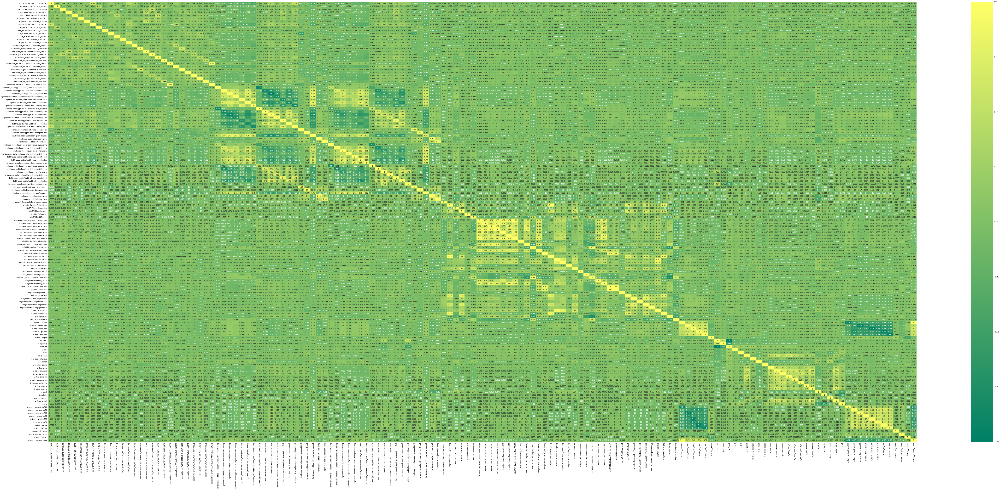

In [158]:
# creating heatmap
plt.figure(figsize=(120,50))
sns.heatmap(df_normal[numeric_cols_normal].corr(), annot=True, cmap='summer')
plt.show()

In [ ]:
df_normal.describe(include="all")

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,aim[AIM.HsvSpectrum][HSV],aim[AIM.HsvSpectrum][Hue],aim[AIM.HsvSpectrum][Saturation],aim[AIM.HsvSpectrum][Value],aim[AIM.JpgFileSize],aim[AIM.LabColours][mean A],aim[AIM.LabColours][mean B],aim[AIM.LabColours][mean Lightness],aim[AIM.LabColours][std A],aim[AIM.LabColours][std B],aim[AIM.LabColours][std Lightness],aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__district,custom__unirank_group
count,480,480.000000,480.000000,480.000000,480.000000,480.000000,480.00000,480.000000,480.000000,480.00000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.00000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,...,480.000000,480.000000,480.000000,480.000000,480.00000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,4.800000e+02,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000,480,480.000000,480.000000,480.000000,480.000000,480.000000,480.00000,480.000000,480.000000,480.000000,480.000000,480.000000,480.000000
unique,480,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,https://istu.ru/,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Москва,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [194]:
# Соберём общую статистику метрик по коду, включая разницу метрик VI - Normal

page_metrics_table_normal = page_metrics_stat(df_normal)
page_metrics_table_vi = page_metrics_stat(df_vi)

results = {}
for idx1, metric_normal in page_metrics_table_normal.iterrows():
  for idx2, metric_vi in page_metrics_table_vi.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      tmpDiff = metric_normal['Mean'] - metric_vi['Mean']
      if metric_normal['Metric'] in results:
        results[metric_normal['Metric']].append(tmpDiff)
      else:
        results[metric_normal['Metric']] = [tmpDiff]

for m, values in results.items():
  results[m] = round(statistics.mean(values), 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.931,2.415,0.00,21.00,-0.013
1,axe_els[AXE.INCOMPLETE_MINOR],3.131,5.756,0.00,67.00,-0.007
2,axe_els[AXE.INCOMPLETE_SERIOUS],49.272,63.566,0.00,774.00,-0.403
3,axe_els[AXE.VIOLATIONS_CRITICAL],13.889,21.707,0.00,253.00,-0.053
4,axe_els[AXE.VIOLATIONS_MINOR],4.606,12.125,0.00,136.00,0.002
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.743,0.115,0.41,0.98,0.000
62,lighthouse_mobile[cat-score_best-practices],0.663,0.111,0.33,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.381,0.209,0.01,0.99,0.000
64,lighthouse_mobile[cat-score_pwa],0.340,0.191,0.00,0.92,0.000


In [112]:
# Далее пособираем статистику для разных случаев. Можно пропустить, это для анализа

page_metrics_table_normal1 = page_metrics_stat(df_normal[(df_normal['custom__region'] != 78) & (df_normal['custom__region'] != 77)])
page_metrics_table_vi1 = page_metrics_stat(df_vi[(df_vi['custom__region'] != 78) & (df_vi['custom__region'] != 77)])

results = {}
for idx1, metric_normal in page_metrics_table_normal1.iterrows():
  for idx2, metric_vi in page_metrics_table_vi1.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      tmpDiff = metric_normal['Mean'] - metric_vi['Mean']
      if metric_normal['Metric'] in results:
        results[metric_normal['Metric']].append(tmpDiff)
      else:
        results[metric_normal['Metric']] = [tmpDiff]

for m, values in results.items():
  results[m] = round(statistics.mean(values), 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal1.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.897,2.437,0.00,21.00,-0.021
1,axe_els[AXE.INCOMPLETE_MINOR],2.912,5.151,0.00,67.00,-0.003
2,axe_els[AXE.INCOMPLETE_SERIOUS],43.747,43.316,0.00,288.00,-0.479
3,axe_els[AXE.VIOLATIONS_CRITICAL],13.321,20.251,0.00,253.00,-0.070
4,axe_els[AXE.VIOLATIONS_MINOR],4.426,11.615,0.00,136.00,0.002
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.741,0.117,0.41,0.98,0.000
62,lighthouse_mobile[cat-score_best-practices],0.654,0.108,0.33,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.400,0.212,0.01,0.99,0.000
64,lighthouse_mobile[cat-score_pwa],0.319,0.184,0.00,0.92,0.000


In [113]:
page_metrics_table_normal2 = page_metrics_stat(df_normal[(df_normal['custom__region'] == 78) | (df_normal['custom__region'] == 77)])
page_metrics_table_vi2 = page_metrics_stat(df_vi[(df_vi['custom__region'] == 78) | (df_vi['custom__region'] == 77)])

results = {}
for idx1, metric_normal in page_metrics_table_normal2.iterrows():
  for idx2, metric_vi in page_metrics_table_vi2.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      tmpDiff = metric_normal['Mean'] - metric_vi['Mean']
      if metric_normal['Metric'] in results:
        results[metric_normal['Metric']].append(tmpDiff)
      else:
        results[metric_normal['Metric']] = [tmpDiff]

for m, values in results.items():
  results[m] = round(statistics.mean(values), 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal2.merge(results, left_on="Metric", right_index=True)

max_rows = pd.get_option('display.max_rows')
pd.set_option('display.max_rows', None)
display(results)
pd.set_option('display.max_rows', max_rows)

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],1.037,2.353,0.000,18.000,0.009
1,axe_els[AXE.INCOMPLETE_MINOR],3.817,7.317,0.000,62.000,-0.018
2,axe_els[AXE.INCOMPLETE_SERIOUS],66.505,102.352,0.000,774.000,-0.165
3,axe_els[AXE.VIOLATIONS_CRITICAL],15.661,25.751,0.000,149.000,0.000
4,axe_els[AXE.VIOLATIONS_MINOR],5.165,13.639,0.000,124.000,0.000
5,axe_els[AXE.VIOLATIONS_MODERATE],33.128,34.953,0.000,178.000,-0.065
6,axe_els[AXE.VIOLATIONS_SERIOUS],48.119,34.865,1.000,159.000,-0.220
7,axe_err[AXE.INCOMPLETE_CRITICAL],0.404,0.529,0.000,2.000,0.000
8,axe_err[AXE.INCOMPLETE_MINOR],0.899,0.526,0.000,2.000,0.000
9,axe_err[AXE.INCOMPLETE_SERIOUS],1.119,0.378,0.000,2.000,0.000


In [114]:
page_metrics_table_normal3 = page_metrics_stat(df_normal[df_normal['custom__district'] != 1])
page_metrics_table_vi3 = page_metrics_stat(df_vi[df_vi['custom__district'] != 1])

results = {}
for idx1, metric_normal in page_metrics_table_normal3.iterrows():
  for idx2, metric_vi in page_metrics_table_vi3.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      results[metric_normal['Metric']] = round(metric_normal['Mean'] - metric_vi['Mean'], 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal3.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.953,2.597,0.00,21.00,-0.010
1,axe_els[AXE.INCOMPLETE_MINOR],3.100,5.259,0.00,67.00,0.010
2,axe_els[AXE.INCOMPLETE_SERIOUS],50.649,67.723,0.00,774.00,-0.461
3,axe_els[AXE.VIOLATIONS_CRITICAL],13.957,22.892,0.00,253.00,-0.120
4,axe_els[AXE.VIOLATIONS_MINOR],4.816,12.348,0.00,136.00,0.007
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.737,0.121,0.41,0.98,0.000
62,lighthouse_mobile[cat-score_best-practices],0.660,0.111,0.33,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.384,0.208,0.01,0.99,0.000
64,lighthouse_mobile[cat-score_pwa],0.336,0.189,0.00,0.92,0.000


In [115]:
page_metrics_table_normal4 = page_metrics_stat(df_normal[df_normal['custom__district'] == 1])
page_metrics_table_vi4 = page_metrics_stat(df_vi[df_vi['custom__district'] == 1])

results = {}
for idx1, metric_normal in page_metrics_table_normal4.iterrows():
  for idx2, metric_vi in page_metrics_table_vi4.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      results[metric_normal['Metric']] = round(metric_normal['Mean'] - metric_vi['Mean'], 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal4.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],0.887,2.012,0.00,14.00,-0.020
1,axe_els[AXE.INCOMPLETE_MINOR],3.193,6.657,0.00,62.00,-0.040
2,axe_els[AXE.INCOMPLETE_SERIOUS],46.527,54.452,0.00,353.00,-0.286
3,axe_els[AXE.VIOLATIONS_CRITICAL],13.753,19.200,0.00,123.00,0.080
4,axe_els[AXE.VIOLATIONS_MINOR],4.187,11.698,0.00,124.00,-0.006
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.753,0.103,0.48,0.95,0.000
62,lighthouse_mobile[cat-score_best-practices],0.668,0.110,0.40,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.374,0.210,0.02,0.95,0.000
64,lighthouse_mobile[cat-score_pwa],0.346,0.194,0.00,0.83,0.000


In [116]:
page_metrics_table_normal1 = page_metrics_stat(df_normal[df_normal['custom__unirank_group'] == 4])
page_metrics_table_vi1 = page_metrics_stat(df_vi[df_vi['custom__unirank_group'] == 4])

results = {}
for idx1, metric_normal in page_metrics_table_normal1.iterrows():
  for idx2, metric_vi in page_metrics_table_vi1.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      tmpDiff = metric_normal['Mean'] - metric_vi['Mean']
      if metric_normal['Metric'] in results:
        results[metric_normal['Metric']].append(tmpDiff)
      else:
        results[metric_normal['Metric']] = [tmpDiff]

for m, values in results.items():
  results[m] = round(statistics.mean(values), 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal1.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],1.009,2.711,0.00,21.00,-0.019
1,axe_els[AXE.INCOMPLETE_MINOR],3.286,7.456,0.00,67.00,-0.005
2,axe_els[AXE.INCOMPLETE_SERIOUS],42.676,62.867,0.00,774.00,-0.239
3,axe_els[AXE.VIOLATIONS_CRITICAL],14.136,20.899,0.00,149.00,-0.122
4,axe_els[AXE.VIOLATIONS_MINOR],4.296,14.588,0.00,136.00,-0.004
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.743,0.124,0.41,0.98,0.000
62,lighthouse_mobile[cat-score_best-practices],0.648,0.107,0.40,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.406,0.215,0.01,0.95,0.000
64,lighthouse_mobile[cat-score_pwa],0.301,0.196,0.00,0.92,0.000


In [117]:
page_metrics_table_normal1 = page_metrics_stat(df_normal[df_normal['custom__unirank_top50'] != 1])
page_metrics_table_vi1 = page_metrics_stat(df_vi[df_vi['custom__unirank_top50'] != 1])

results = {}
for idx1, metric_normal in page_metrics_table_normal1.iterrows():
  for idx2, metric_vi in page_metrics_table_vi1.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      tmpDiff = metric_normal['Mean'] - metric_vi['Mean']
      if metric_normal['Metric'] in results:
        results[metric_normal['Metric']].append(tmpDiff)
      else:
        results[metric_normal['Metric']] = [tmpDiff]

for m, values in results.items():
  results[m] = round(statistics.mean(values), 4)

results = pd.DataFrame.from_dict(results, orient='index')
results

,0
axe_els[AXE.INCOMPLETE_CRITICAL],-0.014
axe_els[AXE.INCOMPLETE_MINOR],-0.003
axe_els[AXE.INCOMPLETE_SERIOUS],-0.450
axe_els[AXE.VIOLATIONS_CRITICAL],-0.061
axe_els[AXE.VIOLATIONS_MINOR],0.002
...,...
lighthouse_mobile[cat-score_accessibility],0.000
lighthouse_mobile[cat-score_best-practices],0.000
lighthouse_mobile[cat-score_performance],0.000
lighthouse_mobile[cat-score_pwa],0.000


In [118]:
# "custom__forbes_top100", "custom__forbes_top50", "custom__raex_top100", "custom__raex_top50", "custom__qs_top", "custom__the_top"

page_metrics_table_normal5 = page_metrics_stat(df_normal[df_normal['custom__raex_top100'] == 1])
page_metrics_table_vi5 = page_metrics_stat(df_vi[df_vi['custom__raex_top100'] == 1])

results = {}
for idx1, metric_normal in page_metrics_table_normal5.iterrows():
  for idx2, metric_vi in page_metrics_table_vi5.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      results[metric_normal['Metric']] = round(metric_normal['Mean'] - metric_vi['Mean'], 4)

results = pd.DataFrame.from_dict(results, orient='index', columns=['Diff'])
results = page_metrics_table_normal5.merge(results, left_on="Metric", right_index=True)
results

,Metric,Mean,Std,Min,Max,Diff
0,axe_els[AXE.INCOMPLETE_CRITICAL],1.329,2.855,0.00,14.00,0.000
1,axe_els[AXE.INCOMPLETE_MINOR],2.647,3.038,0.00,16.00,-0.118
2,axe_els[AXE.INCOMPLETE_SERIOUS],61.518,51.985,4.00,322.00,-0.282
3,axe_els[AXE.VIOLATIONS_CRITICAL],10.988,11.487,0.00,56.00,0.000
4,axe_els[AXE.VIOLATIONS_MINOR],5.153,9.457,0.00,54.00,0.024
...,...,...,...,...,...,...
61,lighthouse_mobile[cat-score_accessibility],0.762,0.095,0.43,0.96,0.000
62,lighthouse_mobile[cat-score_best-practices],0.696,0.107,0.47,0.93,0.000
63,lighthouse_mobile[cat-score_performance],0.317,0.169,0.07,0.93,0.000
64,lighthouse_mobile[cat-score_pwa],0.430,0.163,0.00,0.83,0.000


In [119]:
# Посмотрим метрики по скриншотам и их разницу

screen_metrics_table_normal = screen_metrics_stat(df_normal)
screen_metrics_table_vi = screen_metrics_stat(df_vi)

results = {}
for idx1, metric_normal in screen_metrics_table_normal.iterrows():
  for idx2, metric_vi in screen_metrics_table_vi.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      results[metric_normal['Metric']] = round(metric_normal['Mean'] - metric_vi['Mean'], 4)

results = pd.DataFrame.from_dict(results, orient='index')
results

,0
aim[AIM.DynamicCc][avg cluster colors],-0.666
aim[AIM.DynamicCc][clusters],274.922
aim[AIM.EdgeCongestion],-0.047
aim[AIM.EdgeDensity],0.034
aim[AIM.FgContrast],-0.016
aim[AIM.GridQuality],-7.695
aim[AIM.HasslerSusstrunk][Colorfulness],22.118
aim[AIM.HasslerSusstrunk][dist A],10.636
aim[AIM.HasslerSusstrunk][dist B],12.635
aim[AIM.HasslerSusstrunk][dist RGYB],16.922


In [164]:
screen_metrics_table_normal1 = screen_metrics_stat(df_normal[(df_normal['custom__region'] != 78) & (df_normal['custom__region'] != 77)])
screen_metrics_table_vi1 = screen_metrics_stat(df_vi[(df_vi['custom__region'] != 78) & (df_vi['custom__region'] != 77)])

results = {}
for idx1, metric_normal in screen_metrics_table_normal1.iterrows():
  for idx2, metric_vi in screen_metrics_table_vi1.iterrows():
    if metric_normal['Metric'] == metric_vi['Metric']:
      results[metric_normal['Metric']] = round(metric_normal['Mean'] - metric_vi['Mean'], 4)

results = pd.DataFrame.from_dict(results, orient='index')
results

,0
aim[AIM.DynamicCc][avg cluster colors],-0.712
aim[AIM.DynamicCc][clusters],268.071
aim[AIM.EdgeCongestion],-0.049
aim[AIM.EdgeDensity],0.035
aim[AIM.FgContrast],-0.058
aim[AIM.GridQuality],-9.106
aim[AIM.HasslerSusstrunk][Colorfulness],23.163
aim[AIM.HasslerSusstrunk][dist A],11.262
aim[AIM.HasslerSusstrunk][dist B],12.973
aim[AIM.HasslerSusstrunk][dist RGYB],17.585


In [195]:
def page_metrics_plots_by_okrug(df):
  resultsPage = {}
  resultsScreen = {}
  for okrug, okrugName in okruga.items():
    for pageCode in pageMetricsFull:
      df_tmp = df[df['custom__district'] == okrug]
      df_tmp[pageCode].fillna(0, inplace=True)
      mean_tmp = round(df_tmp[pageCode].mean(), 3)
      if pageCode in resultsPage:
        resultsPage[pageCode][okrug] = {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}
      else:
        resultsPage[pageCode] = {okrug: {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}}

  for okrug, okrugName in okruga.items():      
    for screenCode in screenMetricsFull:
      df_tmp = df[df['custom__district'] == okrug]
      df_tmp[screenCode].fillna(0, inplace=True)
      mean_tmp = round(df_tmp[screenCode].mean(), 3)
      if screenCode in resultsScreen:
        resultsScreen[screenCode][okrug] = {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}
      else:
        resultsScreen[screenCode] = {okrug: {'Mean': mean_tmp, 'Count': df_tmp.shape[0]}}

  # dfScreenTable = pd.DataFrame(screenList)
  # dfScreenTable.columns = ['Metric', 'Mean', 'Std', 'Min', 'Max']
  # display(resultsPage)
  # display(resultsScreen)
  return resultsPage, resultsScreen

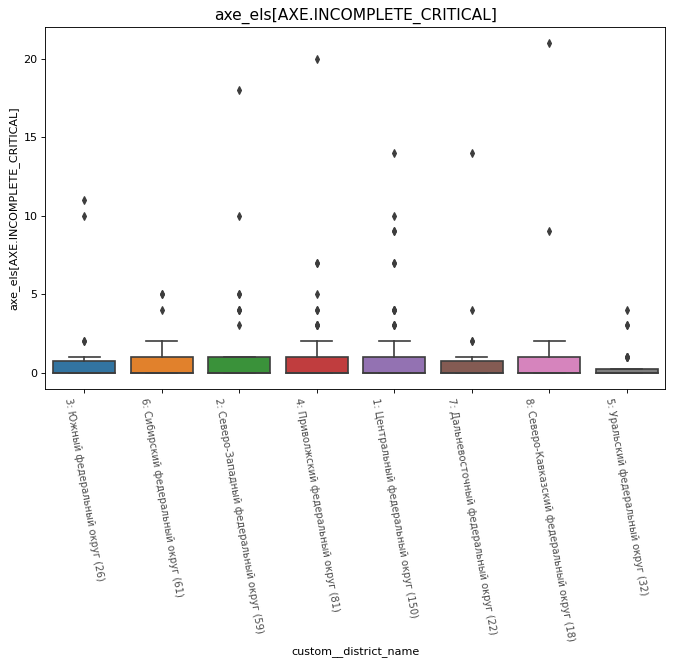

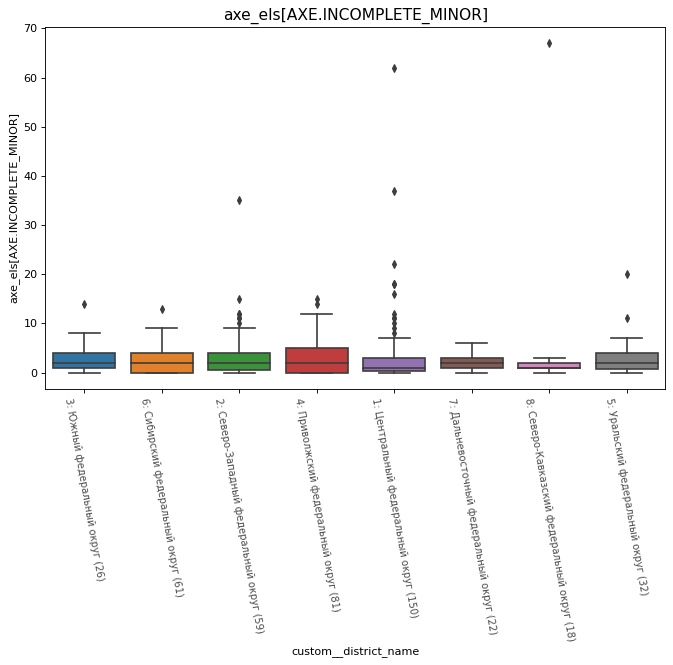

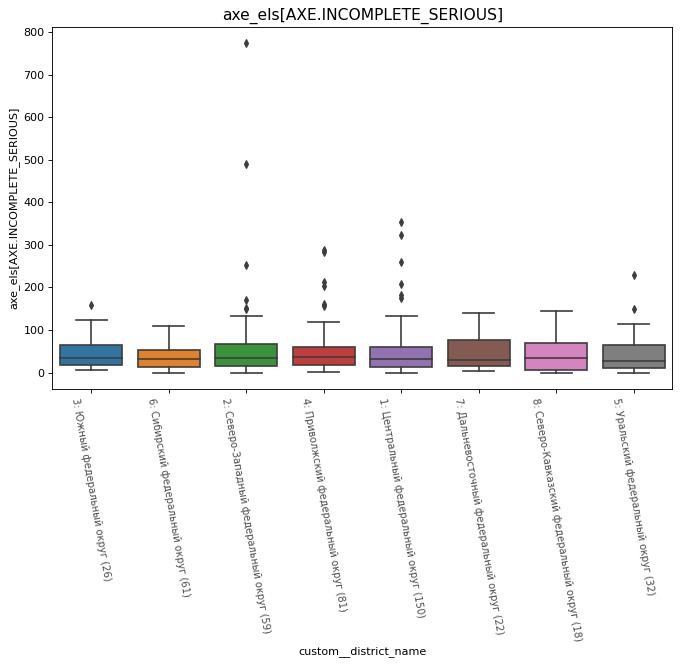

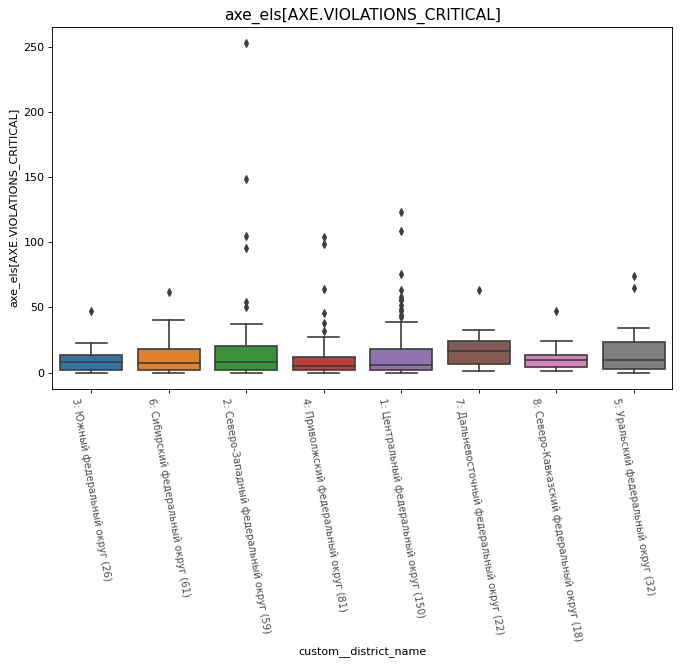

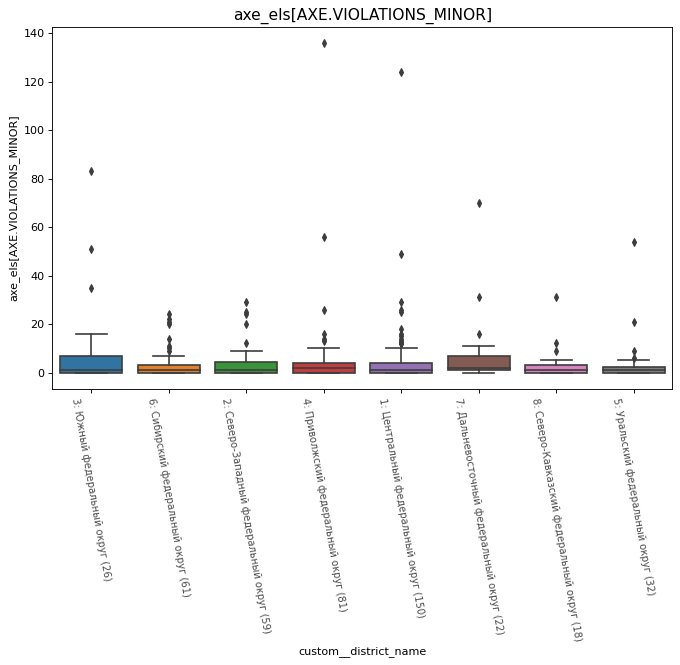

...

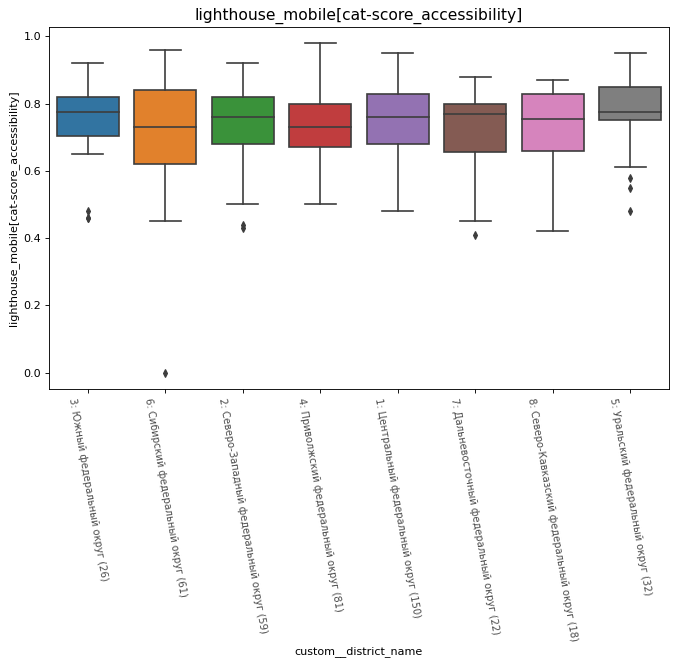

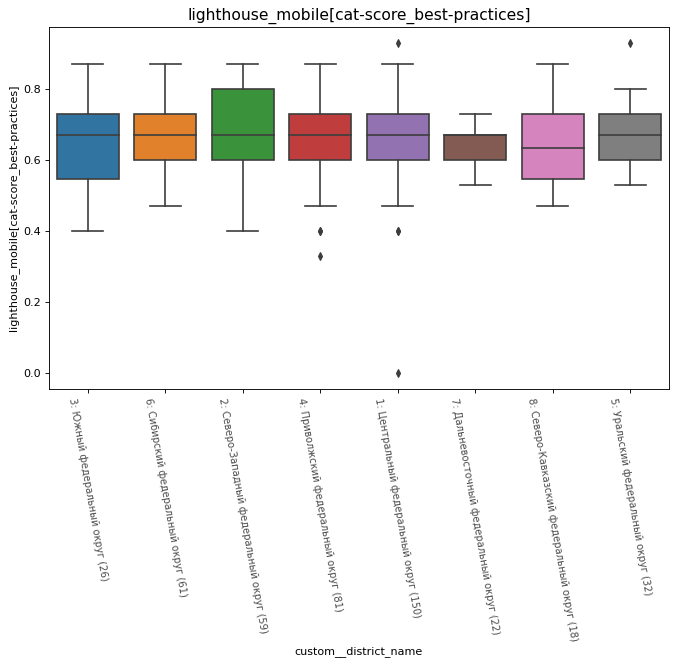

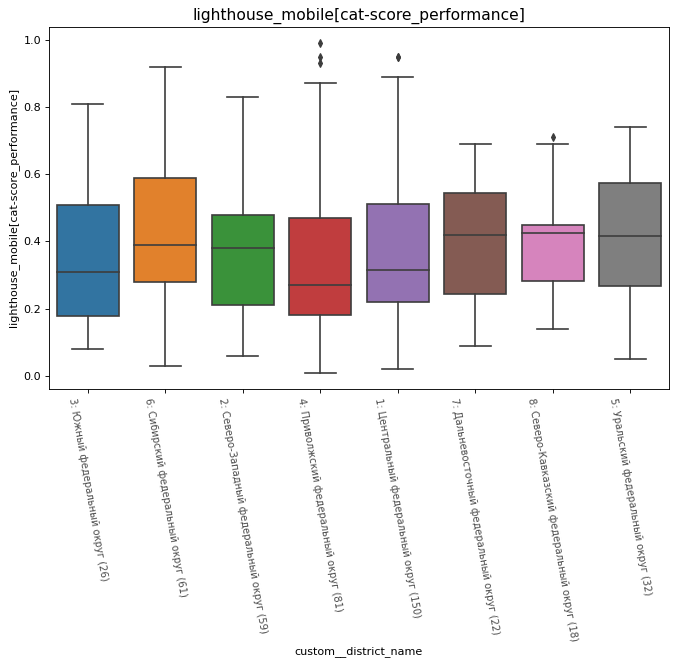

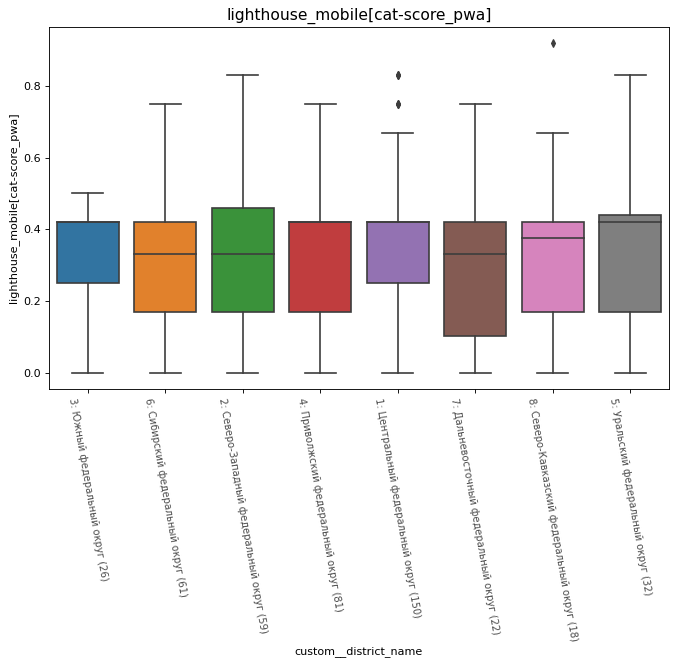

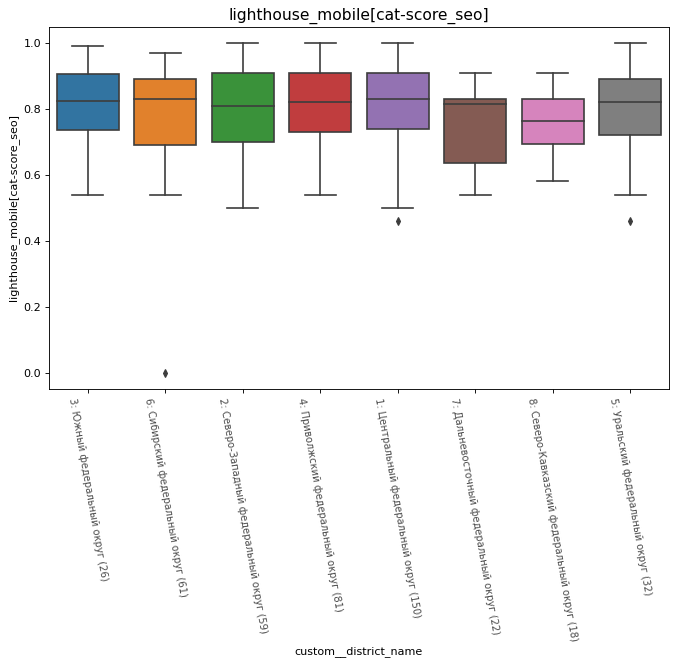

In [121]:
for fullCode in pageMetricsFull:           
  df_tmp = df_normal.drop(df_normal[df_normal.custom__district == 0].index)
  df_tmp[fullCode].fillna(0, inplace=True)
  df_tmp['custom__district_name'] = df_tmp['custom__district'].apply(lambda x: str(x) + ": " + okruga[x] + " (" + str(df_tmp[df_tmp['custom__district'] == x].shape[0]) + ")")

  plt.figure(figsize=(10,6), dpi=80)
  sns.boxplot(x='custom__district_name', y=fullCode, data=df_tmp)

  # Decoration
  plt.title(fullCode, fontsize=14)
  plt.xticks(rotation=-80, fontsize=9, alpha=.7)
  plt.show()

In [122]:
resultsPage, resultsScreen = page_metrics_plots_by_okrug(df_normal)             
for metric, datum in resultsPage.items():
  new = pd.DataFrame.from_dict(datum, orient='index', columns=['Mean', 'Count'])
  new['District'] = new.index
  new['District'] = new['District'].apply(lambda x: okruga[x])
  print(metric)
  display(new)
  print("")

axe_els[AXE.INCOMPLETE_CRITICAL]


,Mean,Count,District
0,NaN,0,None
1,0.887,150,Центральный федеральный округ
2,1.034,59,Северо-Западный федеральный округ
3,1.077,26,Южный федеральный округ
4,1.099,81,Приволжский федеральный округ
5,0.469,32,Уральский федеральный округ
6,0.525,61,Сибирский федеральный округ
7,1.091,22,Дальневосточный федеральный округ
8,2.000,18,Северо-Кавказский федеральный округ



axe_els[AXE.INCOMPLETE_MINOR]


,Mean,Count,District
0,NaN,0,None
1,3.193,150,Центральный федеральный округ
2,3.475,59,Северо-Западный федеральный округ
3,3.038,26,Южный федеральный округ
4,3.148,81,Приволжский федеральный округ
5,2.875,32,Уральский федеральный округ
6,2.590,61,Сибирский федеральный округ
7,2.227,22,Дальневосточный федеральный округ
8,4.944,18,Северо-Кавказский федеральный округ



axe_els[AXE.INCOMPLETE_SERIOUS]


,Mean,Count,District
0,NaN,0,None
1,46.527,150,Центральный федеральный округ
2,68.237,59,Северо-Западный федеральный округ
3,47.308,26,Южный федеральный округ
4,52.259,81,Приволжский федеральный округ
5,44.312,32,Уральский федеральный округ
6,38.082,61,Сибирский федеральный округ
7,49.318,22,Дальневосточный федеральный округ
8,46.056,18,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_CRITICAL]


,Mean,Count,District
0,NaN,0,None
1,13.753,150,Центральный федеральный округ
2,20.390,59,Северо-Западный федеральный округ
3,9.769,26,Южный федеральный округ
4,11.444,81,Приволжский федеральный округ
5,15.031,32,Уральский федеральный округ
6,11.639,61,Сибирский федеральный округ
7,17.773,22,Дальневосточный федеральный округ
8,11.500,18,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_MINOR]


,Mean,Count,District
0,NaN,0,None
1,4.187,150,Центральный федеральный округ
2,3.593,59,Северо-Западный федеральный округ
3,9.308,26,Южный федеральный округ
4,5.358,81,Приволжский федеральный округ
5,3.875,32,Уральский федеральный округ
6,3.180,61,Сибирский федеральный округ
7,7.591,22,Дальневосточный федеральный округ
8,3.722,18,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_MODERATE]


,Mean,Count,District
0,NaN,0,None
1,33.407,150,Центральный федеральный округ
2,33.119,59,Северо-Западный федеральный округ
3,25.731,26,Южный федеральный округ
4,33.395,81,Приволжский федеральный округ
5,29.000,32,Уральский федеральный округ
6,32.885,61,Сибирский федеральный округ
7,30.591,22,Дальневосточный федеральный округ
8,30.111,18,Северо-Кавказский федеральный округ



axe_els[AXE.VIOLATIONS_SERIOUS]


,Mean,Count,District
0,NaN,0,None
1,43.980,150,Центральный федеральный округ
2,40.593,59,Северо-Западный федеральный округ
3,52.731,26,Южный федеральный округ
4,41.765,81,Приволжский федеральный округ
5,39.000,32,Уральский федеральный округ
6,43.115,61,Сибирский федеральный округ
7,43.773,22,Дальневосточный федеральный округ
8,42.889,18,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_CRITICAL]


,Mean,Count,District
0,NaN,0,None
1,0.387,150,Центральный федеральный округ
2,0.288,59,Северо-Западный федеральный округ
3,0.346,26,Южный федеральный округ
4,0.531,81,Приволжский федеральный округ
5,0.281,32,Уральский федеральный округ
6,0.311,61,Сибирский федеральный округ
7,0.318,22,Дальневосточный федеральный округ
8,0.444,18,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_MINOR]


,Mean,Count,District
0,NaN,0,None
1,0.820,150,Центральный федеральный округ
2,0.780,59,Северо-Западный федеральный округ
3,0.885,26,Южный федеральный округ
4,0.802,81,Приволжский федеральный округ
5,0.812,32,Уральский федеральный округ
6,0.738,61,Сибирский федеральный округ
7,0.818,22,Дальневосточный федеральный округ
8,0.944,18,Северо-Кавказский федеральный округ



axe_err[AXE.INCOMPLETE_SERIOUS]


,Mean,Count,District
0,NaN,0,None
1,1.167,150,Центральный федеральный округ
2,1.136,59,Северо-Западный федеральный округ
3,1.077,26,Южный федеральный округ
4,1.185,81,Приволжский федеральный округ
5,1.062,32,Уральский федеральный округ
6,1.164,61,Сибирский федеральный округ
7,1.136,22,Дальневосточный федеральный округ
8,1.000,18,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_CRITICAL]


,Mean,Count,District
0,NaN,0,None
1,1.873,150,Центральный федеральный округ
2,1.763,59,Северо-Западный федеральный округ
3,1.769,26,Южный федеральный округ
4,1.704,81,Приволжский федеральный округ
5,1.906,32,Уральский федеральный округ
6,1.639,61,Сибирский федеральный округ
7,2.000,22,Дальневосточный федеральный округ
8,1.889,18,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_MINOR]


,Mean,Count,District
0,NaN,0,None
1,0.847,150,Центральный федеральный округ
2,0.898,59,Северо-Западный федеральный округ
3,0.808,26,Южный федеральный округ
4,0.901,81,Приволжский федеральный округ
5,0.844,32,Уральский федеральный округ
6,0.689,61,Сибирский федеральный округ
7,1.091,22,Дальневосточный федеральный округ
8,0.722,18,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_MODERATE]


,Mean,Count,District
0,NaN,0,None
1,3.033,150,Центральный федеральный округ
2,3.068,59,Северо-Западный федеральный округ
3,2.923,26,Южный федеральный округ
4,3.198,81,Приволжский федеральный округ
5,3.250,32,Уральский федеральный округ
6,3.246,61,Сибирский федеральный округ
7,3.409,22,Дальневосточный федеральный округ
8,3.444,18,Северо-Кавказский федеральный округ



axe_err[AXE.VIOLATIONS_SERIOUS]


,Mean,Count,District
0,NaN,0,None
1,3.293,150,Центральный федеральный округ
2,3.322,59,Северо-Западный федеральный округ
3,3.077,26,Южный федеральный округ
4,3.309,81,Приволжский федеральный округ
5,3.312,32,Уральский федеральный округ
6,3.115,61,Сибирский федеральный округ
7,3.500,22,Дальневосточный федеральный округ
8,3.333,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.OPERABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,0.953,150,Центральный федеральный округ
2,1.068,59,Северо-Западный федеральный округ
3,2.000,26,Южный федеральный округ
4,1.901,81,Приволжский федеральный округ
5,0.750,32,Уральский федеральный округ
6,1.443,61,Сибирский федеральный округ
7,0.591,22,Дальневосточный федеральный округ
8,1.556,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.OPERABLE_WARNING]


,Mean,Count,District
0,NaN,0,None
1,4.240,150,Центральный федеральный округ
2,2.847,59,Северо-Западный федеральный округ
3,0.615,26,Южный федеральный округ
4,1.827,81,Приволжский федеральный округ
5,0.906,32,Уральский федеральный округ
6,3.656,61,Сибирский федеральный округ
7,0.727,22,Дальневосточный федеральный округ
8,1.222,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.PERCEIVABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,50.373,150,Центральный федеральный округ
2,60.525,59,Северо-Западный федеральный округ
3,69.577,26,Южный федеральный округ
4,48.136,81,Приволжский федеральный округ
5,42.406,32,Уральский федеральный округ
6,43.656,61,Сибирский федеральный округ
7,53.273,22,Дальневосточный федеральный округ
8,48.778,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.PERCEIVABLE_WARNING]


,Mean,Count,District
0,NaN,0,None
1,91.853,150,Центральный федеральный округ
2,111.915,59,Северо-Западный федеральный округ
3,108.115,26,Южный федеральный округ
4,101.457,81,Приволжский федеральный округ
5,77.156,32,Уральский федеральный округ
6,85.393,61,Сибирский федеральный округ
7,95.955,22,Дальневосточный федеральный округ
8,89.833,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.ROBUST_ERROR]


,Mean,Count,District
0,NaN,0,None
1,21.953,150,Центральный федеральный округ
2,21.390,59,Северо-Западный федеральный округ
3,30.808,26,Южный федеральный округ
4,20.519,81,Приволжский федеральный округ
5,16.781,32,Уральский федеральный округ
6,14.475,61,Сибирский федеральный округ
7,17.500,22,Дальневосточный федеральный округ
8,15.889,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.ROBUST_WARNING]


,Mean,Count,District
0,NaN,0,None
1,3.307,150,Центральный федеральный округ
2,2.458,59,Северо-Западный федеральный округ
3,4.385,26,Южный федеральный округ
4,3.173,81,Приволжский федеральный округ
5,2.219,32,Уральский федеральный округ
6,3.033,61,Сибирский федеральный округ
7,4.773,22,Дальневосточный федеральный округ
8,4.500,18,Северо-Кавказский федеральный округ



codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,0.633,150,Центральный федеральный округ
2,0.559,59,Северо-Западный федеральный округ
3,0.769,26,Южный федеральный округ
4,0.815,81,Приволжский федеральный округ
5,0.656,32,Уральский федеральный округ
6,0.787,61,Сибирский федеральный округ
7,0.818,22,Дальневосточный федеральный округ
8,0.556,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.OPERABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,0.427,150,Центральный федеральный округ
2,0.542,59,Северо-Западный федеральный округ
3,0.462,26,Южный федеральный округ
4,0.580,81,Приволжский федеральный округ
5,0.438,32,Уральский федеральный округ
6,0.492,61,Сибирский федеральный округ
7,0.409,22,Дальневосточный федеральный округ
8,0.444,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.OPERABLE_WARNING]


,Mean,Count,District
0,NaN,0,None
1,0.480,150,Центральный федеральный округ
2,0.475,59,Северо-Западный федеральный округ
3,0.231,26,Южный федеральный округ
4,0.432,81,Приволжский федеральный округ
5,0.344,32,Уральский федеральный округ
6,0.541,61,Сибирский федеральный округ
7,0.318,22,Дальневосточный федеральный округ
8,0.333,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.PERCEIVABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,3.740,150,Центральный федеральный округ
2,3.949,59,Северо-Западный федеральный округ
3,3.577,26,Южный федеральный округ
4,3.901,81,Приволжский федеральный округ
5,3.875,32,Уральский федеральный округ
6,3.705,61,Сибирский федеральный округ
7,4.318,22,Дальневосточный федеральный округ
8,4.278,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.PERCEIVABLE_WARNING]


,Mean,Count,District
0,NaN,0,None
1,8.320,150,Центральный федеральный округ
2,8.356,59,Северо-Западный федеральный округ
3,9.269,26,Южный федеральный округ
4,8.469,81,Приволжский федеральный округ
5,8.125,32,Уральский федеральный округ
6,7.689,61,Сибирский федеральный округ
7,8.545,22,Дальневосточный федеральный округ
8,7.889,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.ROBUST_ERROR]


,Mean,Count,District
0,NaN,0,None
1,3.367,150,Центральный федеральный округ
2,3.000,59,Северо-Западный федеральный округ
3,3.385,26,Южный федеральный округ
4,3.185,81,Приволжский федеральный округ
5,3.375,32,Уральский федеральный округ
6,2.967,61,Сибирский федеральный округ
7,3.364,22,Дальневосточный федеральный округ
8,3.167,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.ROBUST_WARNING]


,Mean,Count,District
0,NaN,0,None
1,0.707,150,Центральный федеральный округ
2,0.780,59,Северо-Западный федеральный округ
3,0.846,26,Южный федеральный округ
4,0.741,81,Приволжский федеральный округ
5,0.656,32,Уральский федеральный округ
6,0.623,61,Сибирский федеральный округ
7,0.955,22,Дальневосточный федеральный округ
8,1.000,18,Северо-Кавказский федеральный округ



codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]


,Mean,Count,District
0,NaN,0,None
1,0.593,150,Центральный федеральный округ
2,0.475,59,Северо-Западный федеральный округ
3,0.615,26,Южный федеральный округ
4,0.716,81,Приволжский федеральный округ
5,0.656,32,Уральский федеральный округ
6,0.738,61,Сибирский федеральный округ
7,0.773,22,Дальневосточный федеральный округ
8,0.500,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_cumulative-layout-shift]


,Mean,Count,District
0,NaN,0,None
1,0.752,150,Центральный федеральный округ
2,0.746,59,Северо-Западный федеральный округ
3,0.663,26,Южный федеральный округ
4,0.673,81,Приволжский федеральный округ
5,0.752,32,Уральский федеральный округ
6,0.732,61,Сибирский федеральный округ
7,0.624,22,Дальневосточный федеральный округ
8,0.783,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_first-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,0.724,150,Центральный федеральный округ
2,0.695,59,Северо-Западный федеральный округ
3,0.560,26,Южный федеральный округ
4,0.654,81,Приволжский федеральный округ
5,0.683,32,Уральский федеральный округ
6,0.759,61,Сибирский федеральный округ
7,0.601,22,Дальневосточный федеральный округ
8,0.730,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_interactive]


,Mean,Count,District
0,NaN,0,None
1,0.720,150,Центральный федеральный округ
2,0.757,59,Северо-Западный федеральный округ
3,0.695,26,Южный федеральный округ
4,0.697,81,Приволжский федеральный округ
5,0.747,32,Уральский федеральный округ
6,0.810,61,Сибирский федеральный округ
7,0.719,22,Дальневосточный федеральный округ
8,0.788,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_largest-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,0.451,150,Центральный федеральный округ
2,0.419,59,Северо-Западный федеральный округ
3,0.364,26,Южный федеральный округ
4,0.413,81,Приволжский федеральный округ
5,0.413,32,Уральский федеральный округ
6,0.437,61,Сибирский федеральный округ
7,0.490,22,Дальневосточный федеральный округ
8,0.539,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_max-potential-fid]


,Mean,Count,District
0,NaN,0,None
1,0.844,150,Центральный федеральный округ
2,0.830,59,Северо-Западный федеральный округ
3,0.868,26,Южный федеральный округ
4,0.800,81,Приволжский федеральный округ
5,0.905,32,Уральский федеральный округ
6,0.914,61,Сибирский федеральный округ
7,0.887,22,Дальневосточный федеральный округ
8,0.863,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_speed-index]


,Mean,Count,District
0,NaN,0,None
1,0.538,150,Центральный федеральный округ
2,0.511,59,Северо-Западный федеральный округ
3,0.420,26,Южный федеральный округ
4,0.443,81,Приволжский федеральный округ
5,0.505,32,Уральский федеральный округ
6,0.612,61,Сибирский федеральный округ
7,0.397,22,Дальневосточный федеральный округ
8,0.521,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-score_total-blocking-time]


,Mean,Count,District
0,NaN,0,None
1,0.879,150,Центральный федеральный округ
2,0.896,59,Северо-Западный федеральный округ
3,0.884,26,Южный федеральный округ
4,0.807,81,Приволжский федеральный округ
5,0.926,32,Уральский федеральный округ
6,0.955,61,Сибирский федеральный округ
7,0.942,22,Дальневосточный федеральный округ
8,0.889,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_cumulative-layout-shift]


,Mean,Count,District
0,NaN,0,None
1,0.159,150,Центральный федеральный округ
2,0.174,59,Северо-Западный федеральный округ
3,0.250,26,Южный федеральный округ
4,0.230,81,Приволжский федеральный округ
5,0.181,32,Уральский федеральный округ
6,0.188,61,Сибирский федеральный округ
7,0.226,22,Дальневосточный федеральный округ
8,0.196,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_first-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,1267.463,150,Центральный федеральный округ
2,1311.108,59,Северо-Западный федеральный округ
3,1754.168,26,Южный федеральный округ
4,1428.669,81,Приволжский федеральный округ
5,1373.702,32,Уральский федеральный округ
6,1156.778,61,Сибирский федеральный округ
7,1709.570,22,Дальневосточный федеральный округ
8,1187.660,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_interactive]


,Mean,Count,District
0,NaN,0,None
1,3354.221,150,Центральный федеральный округ
2,2969.072,59,Северо-Западный федеральный округ
3,3482.440,26,Южный федеральный округ
4,3452.472,81,Приволжский федеральный округ
5,3096.071,32,Уральский федеральный округ
6,2685.653,61,Сибирский федеральный округ
7,3382.377,22,Дальневосточный федеральный округ
8,2975.170,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_largest-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,3433.239,150,Центральный федеральный округ
2,3336.219,59,Северо-Западный федеральный округ
3,3503.517,26,Южный федеральный округ
4,3586.360,81,Приволжский федеральный округ
5,3498.870,32,Уральский федеральный округ
6,3416.959,61,Сибирский федеральный округ
7,3475.007,22,Дальневосточный федеральный округ
8,2675.703,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_max-potential-fid]


,Mean,Count,District
0,NaN,0,None
1,134.933,150,Центральный федеральный округ
2,181.297,59,Северо-Западный федеральный округ
3,120.154,26,Южный федеральный округ
4,148.247,81,Приволжский федеральный округ
5,105.547,32,Уральский федеральный округ
6,101.672,61,Сибирский федеральный округ
7,116.136,22,Дальневосточный федеральный округ
8,117.722,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_speed-index]


,Mean,Count,District
0,NaN,0,None
1,2510.902,150,Центральный федеральный округ
2,2510.909,59,Северо-Западный федеральный округ
3,3086.346,26,Южный федеральный округ
4,3243.287,81,Приволжский федеральный округ
5,2565.771,32,Уральский федеральный округ
6,2170.988,61,Сибирский федеральный округ
7,3316.140,22,Дальневосточный федеральный округ
8,2609.994,18,Северо-Кавказский федеральный округ



lighthouse_desktop[audit-val_total-blocking-time]


,Mean,Count,District
0,NaN,0,None
1,126.475,150,Центральный федеральный округ
2,187.573,59,Северо-Западный федеральный округ
3,148.212,26,Южный федеральный округ
4,205.634,81,Приволжский федеральный округ
5,82.387,32,Уральский федеральный округ
6,63.023,61,Сибирский федеральный округ
7,89.679,22,Дальневосточный федеральный округ
8,199.883,18,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_accessibility]


,Mean,Count,District
0,NaN,0,None
1,0.736,150,Центральный федеральный округ
2,0.734,59,Северо-Западный федеральный округ
3,0.742,26,Южный федеральный округ
4,0.730,81,Приволжский федеральный округ
5,0.749,32,Уральский федеральный округ
6,0.712,61,Сибирский федеральный округ
7,0.692,22,Дальневосточный федеральный округ
8,0.723,18,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_best-practices]


,Mean,Count,District
0,NaN,0,None
1,0.702,150,Центральный федеральный округ
2,0.715,59,Северо-Западный федеральный округ
3,0.681,26,Южный федеральный округ
4,0.690,81,Приволжский федеральный округ
5,0.721,32,Уральский федеральный округ
6,0.711,61,Сибирский федеральный округ
7,0.685,22,Дальневосточный федеральный округ
8,0.685,18,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_performance]


,Mean,Count,District
0,NaN,0,None
1,0.688,150,Центральный федеральный округ
2,0.683,59,Северо-Западный федеральный округ
3,0.623,26,Южный федеральный округ
4,0.626,81,Приволжский федеральный округ
5,0.687,32,Уральский федеральный округ
6,0.724,61,Сибирский федеральный округ
7,0.670,22,Дальневосточный федеральный округ
8,0.723,18,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_pwa]


,Mean,Count,District
0,NaN,0,None
1,0.319,150,Центральный федеральный округ
2,0.337,59,Северо-Западный федеральный округ
3,0.301,26,Южный федеральный округ
4,0.292,81,Приволжский федеральный округ
5,0.328,32,Уральский федеральный округ
6,0.307,61,Сибирский федеральный округ
7,0.266,22,Дальневосточный федеральный округ
8,0.296,18,Северо-Кавказский федеральный округ



lighthouse_desktop[cat-score_seo]


,Mean,Count,District
0,NaN,0,None
1,0.819,150,Центральный федеральный округ
2,0.820,59,Северо-Западный федеральный округ
3,0.817,26,Южный федеральный округ
4,0.821,81,Приволжский федеральный округ
5,0.800,32,Уральский федеральный округ
6,0.808,61,Сибирский федеральный округ
7,0.785,22,Дальневосточный федеральный округ
8,0.786,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_cumulative-layout-shift]


,Mean,Count,District
0,NaN,0,None
1,0.766,150,Центральный федеральный округ
2,0.667,59,Северо-Западный федеральный округ
3,0.666,26,Южный федеральный округ
4,0.675,81,Приволжский федеральный округ
5,0.779,32,Уральский федеральный округ
6,0.675,61,Сибирский федеральный округ
7,0.703,22,Дальневосточный федеральный округ
8,0.716,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_first-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,0.383,150,Центральный федеральный округ
2,0.401,59,Северо-Западный федеральный округ
3,0.340,26,Южный федеральный округ
4,0.349,81,Приволжский федеральный округ
5,0.373,32,Уральский федеральный округ
6,0.383,61,Сибирский федеральный округ
7,0.333,22,Дальневосточный федеральный округ
8,0.381,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_interactive]


,Mean,Count,District
0,NaN,0,None
1,0.287,150,Центральный федеральный округ
2,0.303,59,Северо-Западный федеральный округ
3,0.263,26,Южный федеральный округ
4,0.250,81,Приволжский федеральный округ
5,0.273,32,Уральский федеральный округ
6,0.331,61,Сибирский федеральный округ
7,0.298,22,Дальневосточный федеральный округ
8,0.286,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_largest-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,0.140,150,Центральный федеральный округ
2,0.121,59,Северо-Западный федеральный округ
3,0.178,26,Южный федеральный округ
4,0.123,81,Приволжский федеральный округ
5,0.159,32,Уральский федеральный округ
6,0.203,61,Сибирский федеральный округ
7,0.170,22,Дальневосточный федеральный округ
8,0.084,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_max-potential-fid]


,Mean,Count,District
0,NaN,0,None
1,0.248,150,Центральный федеральный округ
2,0.236,59,Северо-Западный федеральный округ
3,0.255,26,Южный федеральный округ
4,0.279,81,Приволжский федеральный округ
5,0.333,32,Уральский федеральный округ
6,0.354,61,Сибирский федеральный округ
7,0.332,22,Дальневосточный федеральный округ
8,0.318,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_speed-index]


,Mean,Count,District
0,NaN,0,None
1,0.380,150,Центральный федеральный округ
2,0.377,59,Северо-Западный федеральный округ
3,0.305,26,Южный федеральный округ
4,0.304,81,Приволжский федеральный округ
5,0.347,32,Уральский федеральный округ
6,0.425,61,Сибирский федеральный округ
7,0.305,22,Дальневосточный федеральный округ
8,0.405,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-score_total-blocking-time]


,Mean,Count,District
0,NaN,0,None
1,0.397,150,Центральный федеральный округ
2,0.430,59,Северо-Западный федеральный округ
3,0.405,26,Южный федеральный округ
4,0.411,81,Приволжский федеральный округ
5,0.527,32,Уральский федеральный округ
6,0.579,61,Сибирский федеральный округ
7,0.527,22,Дальневосточный федеральный округ
8,0.523,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_cumulative-layout-shift]


,Mean,Count,District
0,NaN,0,None
1,0.157,150,Центральный федеральный округ
2,0.226,59,Северо-Западный федеральный округ
3,0.240,26,Южный федеральный округ
4,0.228,81,Приволжский федеральный округ
5,0.271,32,Уральский федеральный округ
6,0.261,61,Сибирский федеральный округ
7,0.196,22,Дальневосточный федеральный округ
8,0.276,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_first-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,3970.701,150,Центральный федеральный округ
2,4340.606,59,Северо-Западный федеральный округ
3,5028.197,26,Южный федеральный округ
4,4688.381,81,Приволжский федеральный округ
5,4179.830,32,Уральский федеральный округ
6,3973.846,61,Сибирский федеральный округ
7,4780.047,22,Дальневосточный федеральный округ
8,3916.761,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_interactive]


,Mean,Count,District
0,NaN,0,None
1,15082.323,150,Центральный федеральный округ
2,13029.777,59,Северо-Западный федеральный округ
3,15166.368,26,Южный федеральный округ
4,15984.473,81,Приволжский федеральный округ
5,13971.533,32,Уральский федеральный округ
6,14324.546,61,Сибирский федеральный округ
7,12509.304,22,Дальневосточный федеральный округ
8,13257.464,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_largest-contentful-paint]


,Mean,Count,District
0,NaN,0,None
1,14303.063,150,Центральный федеральный округ
2,12442.444,59,Северо-Западный федеральный округ
3,9976.461,26,Южный федеральный округ
4,13684.199,81,Приволжский федеральный округ
5,10558.888,32,Уральский федеральный округ
6,11263.821,61,Сибирский федеральный округ
7,9739.750,22,Дальневосточный федеральный округ
8,11537.760,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_max-potential-fid]


,Mean,Count,District
0,NaN,0,None
1,573.807,150,Центральный федеральный округ
2,758.305,59,Северо-Западный федеральный округ
3,510.962,26,Южный федеральный округ
4,563.833,81,Приволжский федеральный округ
5,419.406,32,Уральский федеральный округ
6,429.615,61,Сибирский федеральный округ
7,457.500,22,Дальневосточный федеральный округ
8,493.917,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_speed-index]


,Mean,Count,District
0,NaN,0,None
1,8531.918,150,Центральный федеральный округ
2,8373.801,59,Северо-Западный федеральный округ
3,9435.736,26,Южный федеральный округ
4,9848.317,81,Приволжский федеральный округ
5,8317.149,32,Уральский федеральный округ
6,7106.401,61,Сибирский федеральный округ
7,8869.167,22,Дальневосточный федеральный округ
8,8135.964,18,Северо-Кавказский федеральный округ



lighthouse_mobile[audit-val_total-blocking-time]


,Mean,Count,District
0,NaN,0,None
1,1338.496,150,Центральный федеральный округ
2,1362.433,59,Северо-Западный федеральный округ
3,1466.595,26,Южный федеральный округ
4,1836.699,81,Приволжский федеральный округ
5,839.333,32,Уральский федеральный округ
6,2803.233,61,Сибирский федеральный округ
7,769.726,22,Дальневосточный федеральный округ
8,1897.379,18,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_accessibility]


,Mean,Count,District
0,NaN,0,None
1,0.753,150,Центральный федеральный округ
2,0.730,59,Северо-Западный федеральный округ
3,0.745,26,Южный федеральный округ
4,0.739,81,Приволжский федеральный округ
5,0.773,32,Уральский федеральный округ
6,0.720,61,Сибирский федеральный округ
7,0.713,22,Дальневосточный федеральный округ
8,0.724,18,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_best-practices]


,Mean,Count,District
0,NaN,0,None
1,0.663,150,Центральный федеральный округ
2,0.671,59,Северо-Западный федеральный округ
3,0.649,26,Южный федеральный округ
4,0.654,81,Приволжский федеральный округ
5,0.683,32,Уральский федеральный округ
6,0.665,61,Сибирский федеральный округ
7,0.637,22,Дальневосточный федеральный округ
8,0.648,18,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_performance]


,Mean,Count,District
0,NaN,0,None
1,0.374,150,Центральный федеральный округ
2,0.368,59,Северо-Западный федеральный округ
3,0.357,26,Южный федеральный округ
4,0.346,81,Приволжский федеральный округ
5,0.414,32,Уральский федеральный округ
6,0.440,61,Сибирский федеральный округ
7,0.399,22,Дальневосточный федеральный округ
8,0.392,18,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_pwa]


,Mean,Count,District
0,NaN,0,None
1,0.346,150,Центральный федеральный округ
2,0.356,59,Северо-Западный федеральный округ
3,0.345,26,Южный федеральный округ
4,0.323,81,Приволжский федеральный округ
5,0.359,32,Уральский федеральный округ
6,0.333,61,Сибирский федеральный округ
7,0.288,22,Дальневосточный федеральный округ
8,0.331,18,Северо-Кавказский федеральный округ



lighthouse_mobile[cat-score_seo]


,Mean,Count,District
0,NaN,0,None
1,0.805,150,Центральный федеральный округ
2,0.796,59,Северо-Западный федеральный округ
3,0.802,26,Южный федеральный округ
4,0.803,81,Приволжский федеральный округ
5,0.788,32,Уральский федеральный округ
6,0.774,61,Сибирский федеральный округ
7,0.756,22,Дальневосточный федеральный округ
8,0.764,18,Северо-Кавказский федеральный округ


In [196]:
df_normal.head(2)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],lighthouse_desktop[audit-score_cumulative-layout-shift],lighthouse_desktop[audit-score_first-contentful-paint],lighthouse_desktop[audit-score_interactive],lighthouse_desktop[audit-score_largest-contentful-paint],lighthouse_desktop[audit-score_max-potential-fid],lighthouse_desktop[audit-score_speed-index],lighthouse_desktop[audit-score_total-blocking-time],lighthouse_desktop[audit-val_cumulative-layout-shift],lighthouse_desktop[audit-val_first-contentful-paint],lighthouse_desktop[audit-val_interactive],lighthouse_desktop[audit-val_largest-contentful-paint],...,site_error,vi_not_work,vi_found,vi_m_f,vi_b_f,vi_is_panel,vi_is_apply_changes,vi_is_reload,vi_is_cross_pages,vi_font_sizes,vi_color_schemes,vi_pictures_modes,vi_font_sizes_wc,vi_color_schemes_wc,vi_pictures_switch_wc,vi_line_spacing,vi_letter_spacing,vi_scroll,vi_scale_br,vi_another_content,vi_fonts_switch,site_engine,vi_source,site_lang,site_front,site_crm,vi_eval,vi_eval_group,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__category_code,custom__district,custom__unirank_group
0,https://www.adygnet.ru/,2.0,3.0,123.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,0.01,0.91,0.74,0.02,0.92,0.11,0.91,1.440895,906.1105,3322.5355,6962.480,...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,3.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1c-bitrix,bitrix special-aaVersion,php,не определено,не определено,32.0,3,1,0,0,0,0,0,0,0,51,6,3,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,1.00,1.00,1.00,0.65,1.00,1.00,1.00,0.038132,510.1990,530.1990,1953.199,...,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,3.0,2.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,не определено,не определено,не определено,не определено,не определено,39.0,4,1,0,0,0,1,0,0,0,4,7,6,2


In [ ]:
df_normal.filter(regex='^(?!lighthouse_)', axis=1)

,page_url,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR],aim[AIM.DynamicCc][avg cluster colors],aim[AIM.DynamicCc][clusters],aim[AIM.EdgeCongestion],aim[AIM.EdgeDensity],aim[AIM.FgContrast],aim[AIM.GridQuality],aim[AIM.HasslerSusstrunk][Colorfulness],aim[AIM.HasslerSusstrunk][dist A],aim[AIM.HasslerSusstrunk][dist B],aim[AIM.HasslerSusstrunk][dist RGYB],aim[AIM.HasslerSusstrunk][std A],...,aim[AIM.HsvSpectrum][HSV],aim[AIM.HsvSpectrum][Hue],aim[AIM.HsvSpectrum][Saturation],aim[AIM.HsvSpectrum][Value],aim[AIM.JpgFileSize],aim[AIM.LabColours][mean A],aim[AIM.LabColours][mean B],aim[AIM.LabColours][mean Lightness],aim[AIM.LabColours][std A],aim[AIM.LabColours][std B],aim[AIM.LabColours][std Lightness],aim[AIM.Luminance],aim[AIM.PixelSymmetry],aim[AIM.PngFileSize],aim[AIM.QuadtreeDec][balance],aim[AIM.QuadtreeDec][equilibrium],aim[AIM.QuadtreeDec][leaves],aim[AIM.QuadtreeDec][symmetry],aim[AIM.StaticCc],aim[AIM.UniqueRgb],aim[AIM.Wave],aim[AIM.WhiteSpace],custom__unirank,custom__forbes_rank,custom__raex_rank,custom__qs_rank,custom__the_rank,custom__city,custom__region,custom__unirank_top300,custom__unirank_top50,custom__forbes_top100,custom__forbes_top50,custom__raex_top100,custom__raex_top50,custom__qs_top,custom__the_top,custom__city_code,custom__district,custom__unirank_group
0,https://www.adygnet.ru/,2.0,3.0,123.0,1.0,1.0,5.0,16.0,2.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,0.0,74.0,155.0,43.0,12.0,0.0,1.0,0.0,4.0,9.0,2.0,1.0,0.0,13,722,0.210697,0.142643,0.982175,51,142.319703,85.417444,87.976391,122.621308,89.302412,...,15100,26127,16835,256,169566,8.607802,-27.677990,60.432917,30.758022,28.055407,31.066950,82.371337,0.528860,414030,0.851173,0.999787,2647,0.568012,3923,6461,0.705300,0.121287,274.0,200.0,200.0,50.0,12.0,Майкоп,1,1,0,0,0,0,0,0,0,56,3,3
1,https://www.altstu.ru/,0.0,0.0,80.0,7.0,0.0,25.0,24.0,0.0,0.0,1.0,1.0,0.0,4.0,3.0,11.0,0.0,22.0,89.0,0.0,10.0,0.0,1.0,0.0,3.0,8.0,0.0,1.0,0.0,12,402,0.320320,0.103007,0.996520,172,56.202083,17.412386,13.926143,22.296381,40.792555,...,9156,21577,20074,256,144327,-1.416603,0.622743,85.612797,11.496676,11.664596,25.959719,70.122659,0.619102,550278,0.682185,0.999722,2020,0.624323,4566,8998,0.501220,0.650790,131.0,200.0,100.0,50.0,12.0,Барнаул,22,1,0,0,0,1,0,0,0,5,6,2
2,https://www.asu.ru/,0.0,1.0,33.0,5.0,0.0,15.0,43.0,0.0,1.0,1.0,2.0,0.0,3.0,2.0,0.0,2.0,20.0,66.0,29.0,1.0,0.0,0.0,1.0,5.0,7.0,5.0,1.0,0.0,13,436,0.377515,0.143733,1.013893,242,56.922387,12.046764,20.852503,24.082180,22.581931,...,9479,20350,20180,256,184959,1.051904,-2.071201,85.994345,6.199230,19.948852,22.783176,62.138751,0.772779,840936,0.841355,0.999776,2509,0.655857,4218,8253,0.521244,0.493007,26.0,59.0,49.0,18.0,12.0,Барнаул,22,1,1,1,0,1,1,1,0,5,6,0
3,http://angtu.ru/,0.0,7.0,21.0,11.0,2.0,10.0,98.0,0.0,1.0,1.0,2.0,1.0,3.0,4.0,6.0,0.0,93.0,115.0,20.0,0.0,2.0,1.0,0.0,8.0,11.0,2.0,0.0,2.0,13,985,0.347176,0.178831,1.034799,146,55.720966,23.482209,30.648274,38.609984,28.873950,...,19976,12109,18383,256,180426,-3.654960,-6.660501,68.421225,6.319051,17.742701,29.468118,77.859022,0.339416,1094775,0.9127

In [197]:
withoutLighthouse = list(filter(lambda s: 'lighthouse_' not in s, pageMetricsFull))

withoutLighthouseEls = list(filter(lambda s: '_els[' in s, withoutLighthouse))
withoutLighthouseErr = list(filter(lambda s: '_err[' in s, withoutLighthouse))
display(withoutLighthouseEls)
display(withoutLighthouseErr)

['axe_els[AXE.INCOMPLETE_CRITICAL]',
 'axe_els[AXE.INCOMPLETE_MINOR]',
 'axe_els[AXE.INCOMPLETE_SERIOUS]',
 'axe_els[AXE.VIOLATIONS_CRITICAL]',
 'axe_els[AXE.VIOLATIONS_MINOR]',
 'axe_els[AXE.VIOLATIONS_MODERATE]',
 'axe_els[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_els[WCAG.OPERABLE_ERROR]',
 'codesniffer_els[WCAG.OPERABLE_WARNING]',
 'codesniffer_els[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_els[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_els[WCAG.ROBUST_ERROR]',
 'codesniffer_els[WCAG.ROBUST_WARNING]',
 'codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]']

['axe_err[AXE.INCOMPLETE_CRITICAL]',
 'axe_err[AXE.INCOMPLETE_MINOR]',
 'axe_err[AXE.INCOMPLETE_SERIOUS]',
 'axe_err[AXE.VIOLATIONS_CRITICAL]',
 'axe_err[AXE.VIOLATIONS_MINOR]',
 'axe_err[AXE.VIOLATIONS_MODERATE]',
 'axe_err[AXE.VIOLATIONS_SERIOUS]',
 'codesniffer_err[WCAG.OPERABLE_ERROR]',
 'codesniffer_err[WCAG.OPERABLE_WARNING]',
 'codesniffer_err[WCAG.PERCEIVABLE_ERROR]',
 'codesniffer_err[WCAG.PERCEIVABLE_WARNING]',
 'codesniffer_err[WCAG.ROBUST_ERROR]',
 'codesniffer_err[WCAG.ROBUST_WARNING]',
 'codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]']

In [209]:
# Далее будем вычислять разницу средних по метрикам. Выбираем столбец для группировки результатов

# compare_group_by = 'custom__district'
# compare_code_list = okruga.items()

compare_group_by = 'custom__category'
compare_code_list = enumerate(list(range(1, len(df_normal['custom__category'].value_counts())+1)))

# compare_group_by = 'custom__unirank_group'
# compare_code_list = enumerate([0,1,2,3,4])

In [199]:
tmp = withoutLighthouseEls + [compare_group_by]
# print(tmp)

df_normal_stat_els = df_normal.filter(regex='^(?!lighthouse_)', axis=1)
df_normal_stat_els = df_normal_stat_els.filter(regex='^.*(?!_els|custom_)', axis=1)
df_normal_stat_els = df_normal_stat_els[tmp].groupby([compare_group_by], as_index=False).mean()

df_vi_stat_els = df_vi.filter(regex='^(?!lighthouse_)', axis=1)
df_vi_stat_els = df_vi_stat_els.filter(regex='^.*(?!_els|custom_)', axis=1)
df_vi_stat_els = df_vi_stat_els[tmp].groupby([compare_group_by], as_index=False).mean()
df_normal_stat_els

,custom__category,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,0.516129,5.129032,37.032258,13.290323,3.096774,21.741935,27.967742,1.580645,1.548387,38.000000,67.741935,10.903226,4.354839,0.838710
1,архитектурный,0.181818,3.454545,30.272727,13.818182,6.545455,26.272727,28.454545,0.181818,4.363636,40.727273,65.909091,18.636364,0.909091,1.000000
2,гос.структуры,1.500000,7.200000,45.800000,23.000000,4.200000,39.200000,37.800000,1.500000,1.500000,43.700000,86.700000,19.600000,4.300000,0.600000
3,гуманитарный,0.790909,3.227273,50.027273,14.663636,5.172727,33.036364,45.554545,1.245455,2.336364,53.181818,103.972727,21.936364,3.781818,0.590909
4,искусство и культура,0.685185,3.092593,45.351852,13.388889,4.185185,29.018519,35.907407,1.111111,3.814815,46.925926,89.703704,14.537037,2.870370,0.777778
5,медицинский,0.904762,2.380952,45.738095,14.738095,5.476190,35.476190,41.571429,1.833333,4.071429,46.928571,100.619048,26.857143,1.309524,0.833333
6,общий,1.025974,2.805195,45.675325,14.233766,5.194805,32.454545,54.909091,1.350649,2.441558,61.480519,93.909091,21.844156,4.233766,0.740260
7,общий технический,2.115385,2.192308,50.730769,10.423077,3.807692,47.230769,46.346154,1.884615,1.269231,49.461538,107.076923,27.807692,5.769231,0.538462
8,остальное,0.500000,1.500000,57.500000,3.000000,0.000000,13.500000,39.000000,0.500000,0.500000,138.500000,77.000000,9.000000,2.000000,0.000000
9,спец технический,0.983607,2.852459,72.393443,13.639344,4.065574,27.393443,39.032787,0.721311,3.295082,46.491803,101.065574,18.967213,1.770492,0.540984


In [200]:
tmp = withoutLighthouseErr + [compare_group_by]
# print(tmp)

df_normal_stat_err = df_normal.filter(regex='^(?!lighthouse_)', axis=1)
df_normal_stat_err = df_normal_stat_err.filter(regex='^.*(?!_els|custom_)', axis=1)
df_normal_stat_err = df_normal_stat_err[tmp].groupby([compare_group_by], as_index=False).mean()

df_vi_stat_err = df_vi.filter(regex='^(?!lighthouse_)', axis=1)
df_vi_stat_err = df_vi_stat_err.filter(regex='^.*(?!_els|custom_)', axis=1)
df_vi_stat_err = df_vi_stat_err[tmp].groupby([compare_group_by], as_index=False).mean()
df_normal_stat_err

,custom__category,axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,0.354839,0.645161,1.225806,1.612903,0.709677,2.967742,3.032258,0.677419,0.451613,3.967742,7.451613,3.000000,0.870968,0.838710
1,архитектурный,0.181818,1.090909,1.090909,1.454545,0.727273,2.909091,2.727273,0.181818,0.818182,3.545455,6.818182,3.000000,0.636364,0.636364
2,гос.структуры,0.400000,0.700000,1.400000,1.900000,0.900000,2.600000,2.300000,0.500000,0.600000,3.800000,7.300000,2.800000,0.200000,0.600000
3,гуманитарный,0.400000,0.900000,1.090909,1.872727,0.990909,3.145455,3.345455,0.490909,0.418182,3.945455,8.754545,3.790909,0.781818,0.554545
4,искусство и культура,0.425926,0.759259,1.185185,1.648148,0.851852,3.240741,3.351852,0.370370,0.555556,3.444444,7.944444,2.629630,0.796296,0.703704
5,медицинский,0.523810,0.738095,1.214286,1.642857,0.833333,3.309524,3.619048,0.666667,0.523810,3.666667,8.690476,2.976190,0.571429,0.738095
6,общий,0.337662,0.870130,1.116883,1.844156,0.818182,3.272727,3.467532,0.519481,0.389610,4.064935,8.610390,3.519481,0.792208,0.675325
7,общий технический,0.423077,0.653846,1.076923,1.846154,0.884615,2.923077,3.269231,0.576923,0.153846,3.769231,7.846154,2.961538,1.076923,0.538462
8,остальное,0.500000,0.500000,1.000000,2.000000,0.000000,2.000000,2.500000,0.500000,0.500000,3.000000,6.500000,3.000000,1.000000,0.000000
9,спец технический,0.295082,0.737705,1.131148,2.032787,0.786885,3.114754,2.967213,0.360656,0.393443,3.885246,8.327869,3.131148,0.655738,0.491803


In [211]:
df_diff_stat_els = df_normal_stat_els.copy()
for code, name in compare_code_list:
  for pm in withoutLighthouseEls:
    mean_normal = df_normal_stat_els.loc[code, pm]
    mean_vi = df_vi_stat_els.loc[code, pm]
    diff = mean_normal - mean_vi
    df_diff_stat_els.loc[code, pm] = diff

df_diff_stat_els

,custom__category,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,-0.096774,-0.064516,-0.677419,0.322581,0.000000,-0.354839,-0.451613,0.000000,0.000000,-0.064516,0.000000,0.000000,0.000000,0.0
1,архитектурный,0.000000,0.000000,-0.363636,-1.363636,0.000000,-1.181818,0.090909,0.000000,0.000000,-0.181818,-0.454545,0.000000,0.000000,0.0
2,гос.структуры,0.400000,0.000000,-0.500000,0.200000,-0.100000,0.000000,0.500000,-0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,гуманитарный,-0.009091,-0.009091,-0.009091,0.018182,0.009091,-0.054545,-0.209091,0.018182,-0.027273,0.290909,-0.881818,-0.090909,-0.036364,0.0
4,искусство и культура,-0.074074,0.000000,-0.444444,0.092593,0.018519,0.222222,-0.333333,0.000000,0.000000,-0.037037,0.018519,-0.018519,0.018519,0.0
5,медицинский,0.000000,0.000000,0.095238,-0.095238,0.000000,0.071429,-0.214286,0.000000,0.000000,0.047619,0.142857,-0.023810,0.000000,0.0
6,общий,-0.012987,0.012987,-0.779221,-0.051948,0.000000,-0.155844,-0.090909,0.000000,0.000000,0.337662,0.363636,0.000000,0.025974,0.0
7,общий технический,-0.038462,-0.038462,-2.192308,-0.769231,0.000000,-0.807692,0.115385,0.000000,0.000000,0.692308,0.807692,0.076923,0.000000,0.0
8,остальное,0.000000,-0.500000,0.000000,0.000000,0.000000,0.000000,-0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
9,спец технический,0.000000,-0.016393,-0.147541,0.016393,0.000000,0.131148,0.278689,0.000000,0.000000,0.180328,0.000000,0.000000,0.000000,0.0


In [212]:
df_diff_stat_err = df_normal_stat_err.copy()
for code, name in compare_code_list:
  for pm in withoutLighthouseErr:
    mean_normal = df_normal_stat_err.loc[code, pm]
    mean_vi = df_vi_stat_err.loc[code, pm]
    diff = mean_normal - mean_vi
    df_diff_stat_err.loc[code, pm] = diff

df_diff_stat_err

,custom__category,axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,0.354839,0.645161,1.225806,1.612903,0.709677,2.967742,3.032258,0.677419,0.451613,3.967742,7.451613,3.000000,0.870968,0.838710
1,архитектурный,0.181818,1.090909,1.090909,1.454545,0.727273,2.909091,2.727273,0.181818,0.818182,3.545455,6.818182,3.000000,0.636364,0.636364
2,гос.структуры,0.400000,0.700000,1.400000,1.900000,0.900000,2.600000,2.300000,0.500000,0.600000,3.800000,7.300000,2.800000,0.200000,0.600000
3,гуманитарный,0.400000,0.900000,1.090909,1.872727,0.990909,3.145455,3.345455,0.490909,0.418182,3.945455,8.754545,3.790909,0.781818,0.554545
4,искусство и культура,0.425926,0.759259,1.185185,1.648148,0.851852,3.240741,3.351852,0.370370,0.555556,3.444444,7.944444,2.629630,0.796296,0.703704
5,медицинский,0.523810,0.738095,1.214286,1.642857,0.833333,3.309524,3.619048,0.666667,0.523810,3.666667,8.690476,2.976190,0.571429,0.738095
6,общий,0.337662,0.870130,1.116883,1.844156,0.818182,3.272727,3.467532,0.519481,0.389610,4.064935,8.610390,3.519481,0.792208,0.675325
7,общий технический,0.423077,0.653846,1.076923,1.846154,0.884615,2.923077,3.269231,0.576923,0.153846,3.769231,7.846154,2.961538,1.076923,0.538462
8,остальное,0.500000,0.500000,1.000000,2.000000,0.000000,2.000000,2.500000,0.500000,0.500000,3.000000,6.500000,3.000000,1.000000,0.000000
9,спец технический,0.295082,0.737705,1.131148,2.032787,0.786885,3.114754,2.967213,0.360656,0.393443,3.885246,8.327869,3.131148,0.655738,0.491803


In [213]:
# Нормализуем результат (разницу средних по метрикам) от 0 до 1 

from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

df_diff_stat_els_scaled = df_diff_stat_els[[compare_group_by]]
for pm in withoutLighthouseEls:
    scaled = min_max_scaler.fit_transform(df_diff_stat_els[[pm]])
    scaled_df = pd.DataFrame(scaled, columns=[pm])
    df_diff_stat_els_scaled = pd.concat([df_diff_stat_els_scaled, scaled_df], axis=1)

display(df_diff_stat_els_scaled)

,custom__category,axe_els[AXE.INCOMPLETE_CRITICAL],axe_els[AXE.INCOMPLETE_MINOR],axe_els[AXE.INCOMPLETE_SERIOUS],axe_els[AXE.VIOLATIONS_CRITICAL],axe_els[AXE.VIOLATIONS_MINOR],axe_els[AXE.VIOLATIONS_MODERATE],axe_els[AXE.VIOLATIONS_SERIOUS],codesniffer_els[WCAG.OPERABLE_ERROR],codesniffer_els[WCAG.OPERABLE_WARNING],codesniffer_els[WCAG.PERCEIVABLE_ERROR],codesniffer_els[WCAG.PERCEIVABLE_WARNING],codesniffer_els[WCAG.ROBUST_ERROR],codesniffer_els[WCAG.ROBUST_WARNING],codesniffer_els[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,0.000000,0.736973,0.614550,1.000000,0.843750,0.505376,0.048387,0.846154,1.0,0.215755,0.521937,0.541667,0.583333,0.0
1,архитектурный,0.194805,0.846154,0.741844,0.000000,0.843750,0.000000,0.590909,0.846154,1.0,0.094203,0.252897,0.541667,0.583333,0.0
2,гос.структуры,1.000000,0.846154,0.686525,0.927304,0.000000,0.722222,1.000000,0.000000,1.0,0.282609,0.521937,0.541667,0.583333,0.0
3,гуманитарный,0.176505,0.830769,0.885674,0.819478,0.920455,0.688889,0.290909,1.000000,0.0,0.584058,0.000000,0.000000,0.000000,0.0
4,искусство и культура,0.045695,0.846154,0.709062,0.863607,1.000000,0.858025,0.166667,0.846154,1.0,0.244230,0.532898,0.431327,0.880401,0.0
5,медицинский,0.194805,0.846154,0.927997,0.752215,0.843750,0.765873,0.285714,0.846154,1.0,0.331953,0.606492,0.399802,0.583333,0.0
6,общий,0.168663,0.868132,0.573252,0.777888,0.843750,0.626984,0.409091,0.846154,1.0,0.632505,0.737169,0.541667,1.000000,0.0
7,общий технический,0.117383,0.781065,0.000000,0.352508,0.843750,0.228632,0.615385,0.846154,1.0,1.000000,1.000000,1.000000,0.583333,0.0
8,остальное,0.194805,0.000000,0.889362,0.808696,0.843750,0.722222,0.000000,0.846154,1.0,0.282609,0.521937,0.541667,0.583333,0.0
9,спец технический,0.194805,0.818411,0.829508,0.818418,0.843750,0.802368,0.778689,0.846154,1.0,0.469470,0.521937,0.541667,0.583333,0.0


In [214]:
df_diff_stat_err_scaled = df_diff_stat_err[[compare_group_by]]
for pm in withoutLighthouseErr:
    scaled = min_max_scaler.fit_transform(df_diff_stat_err[[pm]])
    scaled_df = pd.DataFrame(scaled, columns=[pm])
    df_diff_stat_err_scaled = pd.concat([df_diff_stat_err_scaled, scaled_df], axis=1)

display(df_diff_stat_err_scaled)

,custom__category,axe_err[AXE.INCOMPLETE_CRITICAL],axe_err[AXE.INCOMPLETE_MINOR],axe_err[AXE.INCOMPLETE_SERIOUS],axe_err[AXE.VIOLATIONS_CRITICAL],axe_err[AXE.VIOLATIONS_MINOR],axe_err[AXE.VIOLATIONS_MODERATE],axe_err[AXE.VIOLATIONS_SERIOUS],codesniffer_err[WCAG.OPERABLE_ERROR],codesniffer_err[WCAG.OPERABLE_WARNING],codesniffer_err[WCAG.PERCEIVABLE_ERROR],codesniffer_err[WCAG.PERCEIVABLE_WARNING],codesniffer_err[WCAG.ROBUST_ERROR],codesniffer_err[WCAG.ROBUST_WARNING],codesniffer_err[WCAG.UNDERSTANDABLE_ERROR]
0,аграрный,0.505921,0.245658,0.564516,0.447565,0.716188,0.677419,0.517758,1.000000,0.448217,0.903226,0.422086,0.419447,0.765139,1.000000
1,архитектурный,0.000000,1.000000,0.227273,0.239216,0.733945,0.636364,0.302112,0.000000,1.000000,0.509091,0.141129,0.419447,0.497608,0.758741
2,гос.структуры,0.637975,0.338462,1.000000,0.825294,0.908257,0.420000,0.000000,0.642012,0.671579,0.746667,0.354839,0.272641,0.000000,0.715385
3,гуманитарный,0.637975,0.676923,0.227273,0.789412,1.000000,0.801818,0.739210,0.623669,0.397895,0.882424,1.000000,1.000000,0.663477,0.661189
4,искусство и культура,0.713783,0.438746,0.462963,0.493936,0.859667,0.868519,0.743734,0.380451,0.604678,0.414815,0.640681,0.147583,0.679987,0.839031
5,медицинский,1.000000,0.402930,0.535714,0.486975,0.840979,0.916667,0.932660,0.978304,0.556892,0.622222,0.971582,0.401970,0.423559,0.880037
6,общий,0.455696,0.626374,0.292208,0.751821,0.825688,0.890909,0.825528,0.681319,0.354887,0.993939,0.936060,0.800763,0.675325,0.805195
7,общий технический,0.705453,0.260355,0.192308,0.754449,0.892731,0.646154,0.685315,0.797223,0.000000,0.717949,0.597084,0.391215,1.000000,0.642012
8,остальное,0.930380,0.000000,0.000000,0.956863,0.000000,0.000000,0.141414,0.642012,0.521053,0.000000,0.000000,0.419447,0.912281,0.000000
9,спец технический,0.331189,0.402270,0.327869,1.000000,0.794104,0.780328,0.471767,0.360850,0.360656,0.826230,0.810748,0.515714,0.519701,0.586381


In [215]:
# Считаем, что сумма разниц = оценка

diffStatEls = {}
for idx, row in df_diff_stat_els_scaled.iterrows():
  region = row[compare_group_by]
  regionSum = 0
  for pm in withoutLighthouseEls:
    regionSum += row[pm]
  diffStatEls[region] = regionSum

diffStatElsDf = pd.DataFrame.from_dict(diffStatEls, orient='index', columns=['DiffNormSumm'])
if (compare_group_by == 'custom__district'):
  diffStatElsDf['District'] = diffStatElsDf.index
  diffStatElsDf['District'] = diffStatElsDf['District'].apply(lambda x: okruga[x])

display(diffStatElsDf.sort_values(by='DiffNormSumm', ascending=False))

,DiffNormSumm
спец технический,9.048510
общий,9.025254
спорт,8.604611
искусство и культура,8.424220
медицинский,8.384243
общий технический,8.368210
транспорт,8.165398
гос.структуры,8.111751
аграрный,7.457883
остальное,7.234534


In [216]:
diffStatErr = {}
for idx, row in df_diff_stat_err_scaled.iterrows():
  region = row[compare_group_by]
  regionSum = 0
  for pm in withoutLighthouseErr:
    regionSum += row[pm]
  diffStatErr[region] = regionSum

diffStatErrDf = pd.DataFrame.from_dict(diffStatErr, orient='index', columns=['DiffNormSumm'])
if (compare_group_by == 'custom__district'):
  diffStatErrDf['District'] = diffStatErrDf.index
  diffStatErrDf['District'] = diffStatErrDf['District'].apply(lambda x: okruga[x])

display(diffStatErrDf.sort_values(by='DiffNormSumm', ascending=False))

,DiffNormSumm
гуманитарный,10.101264
медицинский,9.950491
общий,9.915711
транспорт,8.833307
аграрный,8.633140
искусство и культура,8.288575
общий технический,8.282248
спец технический,8.087805
гос.структуры,7.533109
спорт,6.846908


In [ ]:
# "custom__forbes_top100", "custom__forbes_top50", "custom__raex_top100", "custom__raex_top50", "custom__qs_top", "custom__the_top"

df_normal.groupby(['custom__district', 'custom__raex_top100'])['page_url'].agg(['count'])

count
custom__district custom__raex_top100       
0                0                        1
1                0                      118
                 1                       38
2                0                       53
                 1                       14
3                0                       40
                 1                        8
4                0                       74
                 1                       12
5                0                       27
                 1                        6
6                0                       55
                 1                        9
7                0                       22
                 1                        3